A core Business Strategy of many organizations across globe is to strive to retain existing talents and compete to attract more top talents in order to have a competitive edge over their closest business rivals. 

This is especially prevalent in organisations with businesses that are heavily-reliant on human capital for a differentiating edge, such as Financial Institutions. In such organisations, Staff Cost is a substantial driver of Total Cost, and hence Profitability. For mid-size Financial Institutions, Staff Cost represents as high as about <b>60%-70%</b> of their Total Cost. In larger Financial Institutions, Staff Cost as a percentage of Total Cost remains sizable at about <b>40%-50%</b>.

When employees (especially top talents) leave the organisation, they bring about disruptions to client experience, team's morale and project delivery timelines. They will leave and also bring along with them the experience, training and development exposures that the organisation have previously invested in them. To the organisation, this means additional costs will have to be spent again in the acquisiton and subsequent development of replacement hires.

As such, <b>Employee Attrition</b> is a real strategic issue that organisations have to manage in order to protect the overall profitability of the business.  Organisations that master the effective planning and execution of Talent Management Strategy will emerge a winner in this competitive landscape, especially amidst the challenging and peculiar macro-economic setting that we are in today.


Therefore, an analysis hereinafter is to be provided for hopes to unravel <b>key insights</b> on Employee Attrition Risks (through a specific Company dataset), with the 2 following objectives:

            a. Provide the Management (of Company) with the Top Factors that have a major influence on why their employees leave the organisation
            b. Build a Machine Learning model to predict and identify employees with high attrition risks for early Management (of Company XYZ) intervention

### IMPORTING LIBRARIES

In [335]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os

### READING DATA
1. Total 5 different datasets to read and concatenate

In [336]:
general_data = pd.read_csv('general_data.csv')
manager_survey_data = pd.read_csv('manager_survey_data.csv')
employee_survey_data = pd.read_csv('employee_survey_data.csv')

in_time = pd.read_csv('in_time.csv')
out_time = pd.read_csv('out_time.csv')

### Overview of General Data

In [337]:
general_data.head(5)

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeID,Gender,...,NumCompaniesWorked,Over18,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
0,51,No,Travel_Rarely,Sales,6,2,Life Sciences,1,1,Female,...,1.0,Y,11,8,0,1.0,6,1,0,0
1,31,Yes,Travel_Frequently,Research & Development,10,1,Life Sciences,1,2,Female,...,0.0,Y,23,8,1,6.0,3,5,1,4
2,32,No,Travel_Frequently,Research & Development,17,4,Other,1,3,Male,...,1.0,Y,15,8,3,5.0,2,5,0,3
3,38,No,Non-Travel,Research & Development,2,5,Life Sciences,1,4,Male,...,3.0,Y,11,8,3,13.0,5,8,7,5
4,32,No,Travel_Rarely,Research & Development,10,1,Medical,1,5,Male,...,4.0,Y,12,8,2,9.0,2,6,0,4


In [338]:
print(general_data.shape)

(4410, 24)


In [339]:
general_data.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EmployeeCount', 'EmployeeID', 'Gender',
       'JobLevel', 'JobRole', 'MaritalStatus', 'MonthlyIncome',
       'NumCompaniesWorked', 'Over18', 'PercentSalaryHike', 'StandardHours',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'YearsAtCompany', 'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [340]:
general_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      4410 non-null   int64  
 1   Attrition                4410 non-null   object 
 2   BusinessTravel           4410 non-null   object 
 3   Department               4410 non-null   object 
 4   DistanceFromHome         4410 non-null   int64  
 5   Education                4410 non-null   int64  
 6   EducationField           4410 non-null   object 
 7   EmployeeCount            4410 non-null   int64  
 8   EmployeeID               4410 non-null   int64  
 9   Gender                   4410 non-null   object 
 10  JobLevel                 4410 non-null   int64  
 11  JobRole                  4410 non-null   object 
 12  MaritalStatus            4410 non-null   object 
 13  MonthlyIncome            4410 non-null   int64  
 14  NumCompaniesWorked      

### Overview of Manager data

In [341]:
manager_survey_data.head(5)

,EmployeeID,JobInvolvement,PerformanceRating
0,1,3,3
1,2,2,4
2,3,3,3
3,4,2,3
4,5,3,3


In [342]:
manager_survey_data.shape

(4410, 3)

In [343]:
manager_survey_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   EmployeeID         4410 non-null   int64
 1   JobInvolvement     4410 non-null   int64
 2   PerformanceRating  4410 non-null   int64
dtypes: int64(3)
memory usage: 103.5 KB


### Overview of Employee Survey Data

In [344]:
employee_survey_data.head(5)

,EmployeeID,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance
0,1,3.0,4.0,2.0
1,2,3.0,2.0,4.0
2,3,2.0,2.0,1.0
3,4,4.0,4.0,3.0
4,5,4.0,1.0,3.0


In [345]:
employee_survey_data.shape

(4410, 4)

In [346]:
employee_survey_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   EmployeeID               4410 non-null   int64  
 1   EnvironmentSatisfaction  4385 non-null   float64
 2   JobSatisfaction          4390 non-null   float64
 3   WorkLifeBalance          4372 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 137.9 KB


### Overview of IN_Time Data

In [347]:
in_time.head(5)
print(in_time.shape)

(4410, 262)


In [348]:
# in_time = in_time.fillna(0)

print(in_time.shape)
in_time.head(5)

(4410, 262)


,Unnamed: 0,2015-01-01,2015-01-02,2015-01-05,2015-01-06,2015-01-07,2015-01-08,2015-01-09,2015-01-12,2015-01-13,...,2015-12-18,2015-12-21,2015-12-22,2015-12-23,2015-12-24,2015-12-25,2015-12-28,2015-12-29,2015-12-30,2015-12-31
0,1,NaN,2015-01-02 09:43:45,2015-01-05 10:08:48,2015-01-06 09:54:26,2015-01-07 09:34:31,2015-01-08 09:51:09,2015-01-09 10:09:25,2015-01-12 09:42:53,2015-01-13 10:13:06,...,NaN,2015-12-21 09:55:29,2015-12-22 10:04:06,2015-12-23 10:14:27,2015-12-24 10:11:35,NaN,2015-12-28 10:13:41,2015-12-29 10:03:36,2015-12-30 09:54:12,2015-12-31 10:12:44
1,2,NaN,2015-01-02 10:15:44,2015-01-05 10:21:05,NaN,2015-01-07 09:45:17,2015-01-08 10:09:04,2015-01-09 09:43:26,2015-01-12 10:00:07,2015-01-13 10:43:29,...,2015-12-18 10:37:17,2015-12-21 09:49:02,2015-12-22 10:33:51,2015-12-23 10:12:10,NaN,NaN,2015-12-28 09:31:45,2015-12-29 09:55:49,2015-12-30 10:32:25,2015-12-31 09:27:20
2,3,NaN,2015-01-02 10:17:41,2015-01-05 09:50:50,2015-01-06 10:14:13,2015-01-07 09:47:27,2015-01-08 10:03:40,2015-01-09 10:05:49,2015-01-12 10:03:47,2015-01-13 10:21:26,...,2015-12-18 10:15:14,2015-12-21 10:10:28,2015-12-22 09:44:44,2015-12-23 10:15:54,2015-12-24 10:07:26,NaN,2015-12-28 09:42:05,2015-12-29 09:43:36,2015-12-30 09:34:05,2015-12-31 10:28:39
3,4,NaN,2015-01-02 10:05:06,2015-01-05 09:56:32,2015-01-06 10:11:07,2015-01-07 09:37:30,2015-01-08 10:02:08,2015-01-09 10:08:12,2015-01-12 10:13:42,2015-01-13 09:53:22,...,2015-12-18 10:17:38,2015-12-21 09:58:21,2015-12-22 10:04:25,2015-12-23 10:11:46,2015-12-24 09:43:15,NaN,2015-12-28 09:52:44,2015-12-29 09:33:16,2015-12-30 10:18:12,2015-12-31 10:01:15
4,5,NaN,2015-01-02 10:28:17,2015-01-05 09:49:58,2015-01-06 09:45:28,2015-01-07 09:49:37,2015-01-08 10:19:44,2015-01-09 10:00:50,2015-01-12 10:29:27,2015-01-13 09:59:32,...,2015-12-18 09:58:35,2015-12-21 10:03:41,2015-12-22 10:10:30,2015-12-23 10:13:36,2015-12-24 09:44:24,NaN,2015-12-28 10:05:15,2015-12-29 10:30:53,2015-12-30 09:18:21,2015-12-31 09:41:09


### Overview of OUT_Time Data

In [349]:
print(out_time.shape)
out_time.head(5)

(4410, 262)


,Unnamed: 0,2015-01-01,2015-01-02,2015-01-05,2015-01-06,2015-01-07,2015-01-08,2015-01-09,2015-01-12,2015-01-13,...,2015-12-18,2015-12-21,2015-12-22,2015-12-23,2015-12-24,2015-12-25,2015-12-28,2015-12-29,2015-12-30,2015-12-31
0,1,NaN,2015-01-02 16:56:15,2015-01-05 17:20:11,2015-01-06 17:19:05,2015-01-07 16:34:55,2015-01-08 17:08:32,2015-01-09 17:38:29,2015-01-12 16:58:39,2015-01-13 18:02:58,...,NaN,2015-12-21 17:15:50,2015-12-22 17:27:51,2015-12-23 16:44:44,2015-12-24 17:47:22,NaN,2015-12-28 18:00:07,2015-12-29 17:22:30,2015-12-30 17:40:56,2015-12-31 17:17:33
1,2,NaN,2015-01-02 18:22:17,2015-01-05 17:48:22,NaN,2015-01-07 17:09:06,2015-01-08 17:34:04,2015-01-09 16:52:29,2015-01-12 17:36:48,2015-01-13 18:00:13,...,2015-12-18 18:31:28,2015-12-21 17:34:16,2015-12-22 18:16:35,2015-12-23 17:38:18,NaN,NaN,2015-12-28 17:08:38,2015-12-29 17:54:46,2015-12-30 18:31:35,2015-12-31 17:40:58
2,3,NaN,2015-01-02 16:59:14,2015-01-05 17:06:46,2015-01-06 16:38:32,2015-01-07 16:33:21,2015-01-08 17:24:22,2015-01-09 16:57:30,2015-01-12 17:28:54,2015-01-13 17:21:25,...,2015-12-18 17:02:23,2015-12-21 17:20:17,2015-12-22 16:32:50,2015-12-23 16:59:43,2015-12-24 16:58:25,NaN,2015-12-28 16:43:31,2015-12-29 17:09:56,2015-12-30 17:06:25,2015-12-31 17:15:50
3,4,NaN,2015-01-02 17:25:24,2015-01-05 17:14:03,2015-01-06 17:07:42,2015-01-07 16:32:40,2015-01-08 16:53:11,2015-01-09 17:19:47,2015-01-12 17:13:37,2015-01-13 17:11:45,...,2015-12-18 17:55:23,2015-12-21 16:49:09,2015-12-22 17:24:00,2015-12-23 17:36:35,2015-12-24 16:48:21,NaN,2015-12-28 17:19:34,2015-12-29 16:58:16,2015-12-30 17:40:11,2015-12-31 17:09:14
4,5,NaN,2015-01-02 18:31:37,2015-01-05 17:49:15,2015-01-06 17:26:25,2015-01-07 17:37:59,2015-01-08 17:59:28,2015-01-09 17:44:08,2015-01-12 18:51:21,2015-01-13 18:14:58,...,2015-12-18 17:52:48,2015-12-21 17:43:35,2015-12-22 18:07:57,2015-12-23 18:00:49,2015-12-24 17:59:22,NaN,2015-12-28 17:44:59,2015-12-29 18:47:00,2015-12-30 17:15:33,2015-12-31 17:42:14


DATA cleaning of time dataset

In [350]:
# in_time_2 = pd.read_csv("in_time.csv")
in_time.iloc[:,1:] = in_time.iloc[:,1:].astype('datetime64[ns]')
in_time.rename({'Unnamed: 0': 'EmployeeID'}, axis=1, inplace=True)

print(in_time.shape)
in_time[:2]

(4410, 262)


,EmployeeID,2015-01-01,2015-01-02,2015-01-05,2015-01-06,2015-01-07,2015-01-08,2015-01-09,2015-01-12,2015-01-13,...,2015-12-18,2015-12-21,2015-12-22,2015-12-23,2015-12-24,2015-12-25,2015-12-28,2015-12-29,2015-12-30,2015-12-31
0,1,NaT,2015-01-02 09:43:45,2015-01-05 10:08:48,2015-01-06 09:54:26,2015-01-07 09:34:31,2015-01-08 09:51:09,2015-01-09 10:09:25,2015-01-12 09:42:53,2015-01-13 10:13:06,...,NaT,2015-12-21 09:55:29,2015-12-22 10:04:06,2015-12-23 10:14:27,2015-12-24 10:11:35,NaT,2015-12-28 10:13:41,2015-12-29 10:03:36,2015-12-30 09:54:12,2015-12-31 10:12:44
1,2,NaT,2015-01-02 10:15:44,2015-01-05 10:21:05,NaT,2015-01-07 09:45:17,2015-01-08 10:09:04,2015-01-09 09:43:26,2015-01-12 10:00:07,2015-01-13 10:43:29,...,2015-12-18 10:37:17,2015-12-21 09:49:02,2015-12-22 10:33:51,2015-12-23 10:12:10,NaT,NaT,2015-12-28 09:31:45,2015-12-29 09:55:49,2015-12-30 10:32:25,2015-12-31 09:27:20


In [351]:
weekends = ['2015-12-25', '2015-10-02', '2015-11-11', '2015-05-01',
            '2015-01-14', '2015-11-10', '2015-03-05', '2015-07-17',
            '2015-01-26', '2015-11-09', '2015-09-17', '2015-01-01']

In [352]:
in_time.drop(weekends, axis=1, inplace=True)
print(in_time.shape)
in_time[:2]

(4410, 250)


,EmployeeID,2015-01-02,2015-01-05,2015-01-06,2015-01-07,2015-01-08,2015-01-09,2015-01-12,2015-01-13,2015-01-15,...,2015-12-17,2015-12-18,2015-12-21,2015-12-22,2015-12-23,2015-12-24,2015-12-28,2015-12-29,2015-12-30,2015-12-31
0,1,2015-01-02 09:43:45,2015-01-05 10:08:48,2015-01-06 09:54:26,2015-01-07 09:34:31,2015-01-08 09:51:09,2015-01-09 10:09:25,2015-01-12 09:42:53,2015-01-13 10:13:06,2015-01-15 10:01:24,...,NaT,NaT,2015-12-21 09:55:29,2015-12-22 10:04:06,2015-12-23 10:14:27,2015-12-24 10:11:35,2015-12-28 10:13:41,2015-12-29 10:03:36,2015-12-30 09:54:12,2015-12-31 10:12:44
1,2,2015-01-02 10:15:44,2015-01-05 10:21:05,NaT,2015-01-07 09:45:17,2015-01-08 10:09:04,2015-01-09 09:43:26,2015-01-12 10:00:07,2015-01-13 10:43:29,2015-01-15 09:37:57,...,2015-12-17 09:15:08,2015-12-18 10:37:17,2015-12-21 09:49:02,2015-12-22 10:33:51,2015-12-23 10:12:10,NaT,2015-12-28 09:31:45,2015-12-29 09:55:49,2015-12-30 10:32:25,2015-12-31 09:27:20


In [353]:
time_in_hour = pd.DataFrame()
for col in in_time.columns[1:]:
    time = pd.DatetimeIndex(in_time[col])
    time_in_hour[col] = (time.hour * 60 + time.minute)/60

In [354]:
out_time.iloc[:,1:] = out_time.iloc[:,1:].astype('datetime64[ns]')
out_time.rename({'Unnamed: 0': 'EmployeeID'}, axis=1, inplace=True)
out_time.drop(weekends, axis=1, inplace=True)

# print(time_out_2.shape)
# time_out_2[:2]

In [355]:
time_out_hour = pd.DataFrame()
for col in out_time.columns[1:]:
    time = pd.DatetimeIndex(out_time[col])
    time_out_hour[col] = (time.hour * 60 + time.minute)/60
time_out_hour[:2]

,2015-01-02,2015-01-05,2015-01-06,2015-01-07,2015-01-08,2015-01-09,2015-01-12,2015-01-13,2015-01-15,2015-01-16,...,2015-12-17,2015-12-18,2015-12-21,2015-12-22,2015-12-23,2015-12-24,2015-12-28,2015-12-29,2015-12-30,2015-12-31
0,16.933333,17.333333,17.316667,16.566667,17.133333,17.633333,16.966667,18.033333,17.366667,17.583333,...,NaN,NaN,17.250000,17.450000,16.733333,17.783333,18.000000,17.366667,17.666667,17.283333
1,18.366667,17.800000,NaN,17.150000,17.566667,16.866667,17.600000,18.000000,17.233333,17.666667,...,17.166667,18.516667,17.566667,18.266667,17.633333,NaN,17.133333,17.900000,18.516667,17.666667


In [356]:
time_df = pd.DataFrame()
time_df['EmployeeID_in'] = in_time['EmployeeID']
time_df['EmployeeID_out'] = out_time['EmployeeID']
# time_df.head(5)
time_df['EmployeeID'] = time_df['EmployeeID_in'] - time_df['EmployeeID_out']
# time_df.head(5)
not_zero = time_df.loc[time_df['EmployeeID'] != 0]
# not_zero
time_df['EmployeeID'] = in_time['EmployeeID']
# time_df.head(2)
time_df.drop(['EmployeeID_in','EmployeeID_out'], axis=1, inplace=True)
# time_df[:2]

In [357]:
in_avg = pd.DataFrame()
time_df['in_avg'] = time_in_hour.iloc[:,1:].mean(axis=1)
# time_df[:2]
out_avg = pd.DataFrame()
time_df['out_avg'] = time_out_hour.iloc[:,1:].mean(axis=1)
time_df[:2]

,EmployeeID,in_avg,out_avg
0,1,9.994228,17.369048
1,2,9.979574,17.695603


In [358]:
time_df['avg_work_day'] = time_df['out_avg'] - time_df['in_avg']
time_df['num_day_off'] = time_in_hour.isnull().sum(axis=1)
time_df[:2]

,EmployeeID,in_avg,out_avg,avg_work_day,num_day_off
0,1,9.994228,17.369048,7.374820,17
1,2,9.979574,17.695603,7.716028,13


### Concatenating All the data into a DataFrame

In [359]:
df =  pd.concat([employee_survey_data.set_index('EmployeeID'), manager_survey_data.set_index('EmployeeID'),general_data.set_index('EmployeeID')], axis=1, join='inner').reset_index()
df =  pd.concat([df.set_index('EmployeeID'), time_df.set_index('EmployeeID')], axis=1, join='inner').reset_index()
df.reset_index(drop=True, inplace=True)
df

,EmployeeID,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating,Age,Attrition,BusinessTravel,Department,...,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,in_avg,out_avg,avg_work_day,num_day_off
0,1,3.0,4.0,2.0,3,3,51,No,Travel_Rarely,Sales,...,0,1.0,6,1,0,0,9.994228,17.369048,7.374820,17
1,2,3.0,2.0,4.0,2,4,31,Yes,Travel_Frequently,Research & Development,...,1,6.0,3,5,1,4,9.979574,17.695603,7.716028,13
2,3,2.0,2.0,1.0,3,3,32,No,Travel_Frequently,Research & Development,...,3,5.0,2,5,0,3,10.015491,17.030290,7.014799,7
3,4,4.0,4.0,3.0,2,3,38,No,Non-Travel,Research & Development,...,3,13.0,5,8,7,5,9.973362,17.166239,7.192877,14
4,5,4.0,1.0,3.0,3,3,32,No,Travel_Rarely,Research & Development,...,2,9.0,2,6,0,4,9.988115,17.994194,8.006079,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4405,4406,4.0,1.0,3.0,3,3,42,No,Travel_Rarely,Research & Development,...,1,10.0,5,3,0,2,10.014118,18.538017,8.523898,6
4406,4407,4.0,4.0,3.0,2,3,29,No,Travel_Rarely,Research & Development,...,0,10.0,2,3,0,2,9.995972,16.088333,6.092361,8
4407,4408,1.0,3.0,3.0,3,4,25,No,Travel_Rarely,Research & Development,...,0,5.0,4,4,1,2,9.971304,17.680145,7.708841,18
4408,4409,4.0,1.0,3.0,2,3,42,No,Travel_Rarely,Sales,...,1,10.0,2,9,7,8,10.009514,19.501736,9.492222,8


Dropping columns with every value unique

Attrition rate does not depend on these features
*   EmployeeID : a unique ID, 
*   Over18 - unique single value (i.e. Y)
*   EmployeeCount - 1 for every employee
*   StandardHours - 8 hours for every employee

In [360]:
df.drop(['EmployeeCount', 'Over18', 'StandardHours', 'EmployeeID'], axis=1, inplace=True)
df

,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating,Age,Attrition,BusinessTravel,Department,DistanceFromHome,...,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,in_avg,out_avg,avg_work_day,num_day_off
0,3.0,4.0,2.0,3,3,51,No,Travel_Rarely,Sales,6,...,0,1.0,6,1,0,0,9.994228,17.369048,7.374820,17
1,3.0,2.0,4.0,2,4,31,Yes,Travel_Frequently,Research & Development,10,...,1,6.0,3,5,1,4,9.979574,17.695603,7.716028,13
2,2.0,2.0,1.0,3,3,32,No,Travel_Frequently,Research & Development,17,...,3,5.0,2,5,0,3,10.015491,17.030290,7.014799,7
3,4.0,4.0,3.0,2,3,38,No,Non-Travel,Research & Development,2,...,3,13.0,5,8,7,5,9.973362,17.166239,7.192877,14
4,4.0,1.0,3.0,3,3,32,No,Travel_Rarely,Research & Development,10,...,2,9.0,2,6,0,4,9.988115,17.994194,8.006079,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4405,4.0,1.0,3.0,3,3,42,No,Travel_Rarely,Research & Development,5,...,1,10.0,5,3,0,2,10.014118,18.538017,8.523898,6
4406,4.0,4.0,3.0,2,3,29,No,Travel_Rarely,Research & Development,2,...,0,10.0,2,3,0,2,9.995972,16.088333,6.092361,8
4407,1.0,3.0,3.0,3,4,25,No,Travel_Rarely,Research & Development,25,...,0,5.0,4,4,1,2,9.971304,17.680145,7.708841,18
4408,4.0,1.0,3.0,2,3,42,No,Travel_Rarely,Sales,18,...,1,10.0,2,9,7,8,10.009514,19.501736,9.492222,8


### Null Values in datasets
* We remove all null data points

In [361]:
def NaN_info(df):
    global null_view
    try:
        null_view = df[[col for col in df.columns if df[col].isna().sum() > 0]].isna().sum().sort_values(ascending = True)
        null_view = pd.DataFrame(null_view, columns=['NANs'])
        null_view[['PERCENT']] = null_view.NANs.apply(lambda x: round((x/len(df))*100, 2))
        null_view[['TYPE']] = df.dtypes
    except:
        return null_view
    return null_view

print(f'There is {df.isna().any(axis=1).mean()*100:.2f}% Nans')
NaN_info(df)

There is 2.49% Nans


,NANs
TotalWorkingYears,9
NumCompaniesWorked,19
JobSatisfaction,20
EnvironmentSatisfaction,25
WorkLifeBalance,38


In [362]:
indexes = df.loc[pd.isnull(df[['JobSatisfaction', 'EnvironmentSatisfaction', 'WorkLifeBalance', 'TotalWorkingYears','NumCompaniesWorked']]).any(1), :].index.values
print(f'Total Number of indexes with missing data: {len(indexes)}')
print(indexes)

Total Number of indexes with missing data: 110
[  11   23   40   84  111  115  124  137  195  210  273  300  308  313
  343  405  476  483  489  574  586  609  647  678  735  799  846  859
  861  909  932  987 1077 1092 1103 1195 1197 1224 1260 1312 1323 1407
 1468 1470 1476 1517 1521 1533 1596 1659 1678 1711 1722 1785 1812 1848
 1909 1911 1953 1996 2016 2079 2142 2148 2182 2226 2310 2365 2367 2379
 2394 2476 2478 2568 2583 2696 2707 2709 2736 2875 2898 2925 3024 3063
 3085 3114 3120 3261 3295 3339 3387 3526 3533 3534 3654 3681 3778 3818
 3885 3910 3996 4030 4116 4219 4226 4305 4332 4345 4395 4409]


In [363]:
df = df.drop(df.index[indexes])
time_df = time_df.drop(time_df.index[indexes])
df.reset_index(drop=True, inplace=True)
time_df.reset_index(drop=True, inplace=True)
print(df.shape)
print(time_df.shape)

(4300, 29)
(4300, 5)


In [364]:
df

,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating,Age,Attrition,BusinessTravel,Department,DistanceFromHome,...,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,in_avg,out_avg,avg_work_day,num_day_off
0,3.0,4.0,2.0,3,3,51,No,Travel_Rarely,Sales,6,...,0,1.0,6,1,0,0,9.994228,17.369048,7.374820,17
1,3.0,2.0,4.0,2,4,31,Yes,Travel_Frequently,Research & Development,10,...,1,6.0,3,5,1,4,9.979574,17.695603,7.716028,13
2,2.0,2.0,1.0,3,3,32,No,Travel_Frequently,Research & Development,17,...,3,5.0,2,5,0,3,10.015491,17.030290,7.014799,7
3,4.0,4.0,3.0,2,3,38,No,Non-Travel,Research & Development,2,...,3,13.0,5,8,7,5,9.973362,17.166239,7.192877,14
4,4.0,1.0,3.0,3,3,32,No,Travel_Rarely,Research & Development,10,...,2,9.0,2,6,0,4,9.988115,17.994194,8.006079,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4295,3.0,4.0,3.0,2,3,29,No,Travel_Rarely,Sales,4,...,0,6.0,2,6,1,5,9.989876,17.284711,7.294835,6
4296,4.0,1.0,3.0,3,3,42,No,Travel_Rarely,Research & Development,5,...,1,10.0,5,3,0,2,10.014118,18.538017,8.523898,6
4297,4.0,4.0,3.0,2,3,29,No,Travel_Rarely,Research & Development,2,...,0,10.0,2,3,0,2,9.995972,16.088333,6.092361,8
4298,1.0,3.0,3.0,3,4,25,No,Travel_Rarely,Research & Development,25,...,0,5.0,4,4,1,2,9.971304,17.680145,7.708841,18


### DESCRIPTIVE STATISTICS

In [365]:
df.describe(include='all')

,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating,Age,Attrition,BusinessTravel,Department,DistanceFromHome,...,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,in_avg,out_avg,avg_work_day,num_day_off
count,4300.000000,4300.000000,4300.000000,4300.000000,4300.000000,4300.000000,4300,4300,4300,4300.000000,...,4300.000000,4300.000000,4300.000000,4300.000000,4300.000000,4300.000000,4300.000000,4300.000000,4300.000000,4300.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,2,3,3,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,No,Travel_Rarely,Research & Development,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,3605,3051,2807,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,2.723953,2.724884,2.761163,2.728837,3.153953,36.926977,NaN,NaN,NaN,9.197907,...,0.795349,11.285116,2.796279,7.026047,2.190000,4.132558,9.991750,17.694649,7.702899,12.729302
std,1.093802,1.101875,0.707800,0.710769,0.360946,9.146517,NaN,NaN,NaN,8.097059,...,0.853534,7.790052,1.290142,6.148036,3.230818,3.565831,0.018163,1.342922,1.342722,5.494883
min,1.000000,1.000000,1.000000,1.000000,3.000000,18.000000,NaN,NaN,NaN,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.929202,15.939259,5.950811,1.000000
25%,2.000000,2.000000,2.000000,2.000000,3.000000,30.000000,NaN,NaN,NaN,2.000000,...,0.000000,6.000000,2.000000,3.000000,0.000000,2.000000,9.979782,16.652354,6.669057,8.000000
50%,3.000000,3.000000,3.000000,3.000000,3.000000,36.000000,NaN,NaN,NaN,7.000000,...,1.000000,10.000000,3.000000,5.000000,1.000000,3.000000,9.992026,17.400700,7.408136,13.000000
75%,4.000000,4.000000,3.000000,3.000000,3.000000,43.000000,NaN,NaN,NaN,14.000000,...,1.000000,15.000000,3.000000,9.250000,3.000000,7.000000,10.003771,18.361685,8.379976,17.000000


In [366]:
df.columns

Index(['EnvironmentSatisfaction', 'JobSatisfaction', 'WorkLifeBalance',
       'JobInvolvement', 'PerformanceRating', 'Age', 'Attrition',
       'BusinessTravel', 'Department', 'DistanceFromHome', 'Education',
       'EducationField', 'Gender', 'JobLevel', 'JobRole', 'MaritalStatus',
       'MonthlyIncome', 'NumCompaniesWorked', 'PercentSalaryHike',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'YearsAtCompany', 'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'in_avg', 'out_avg', 'avg_work_day', 'num_day_off'],
      dtype='object')

In [367]:
df.Attrition.value_counts(normalize=True).to_frame()

,Attrition
No,0.838372
Yes,0.161628


#### Attrition rate = 16.1627906%

### Exploratory Data Alaysis

* #### CATEGORICAL DATA VISUALIZATION

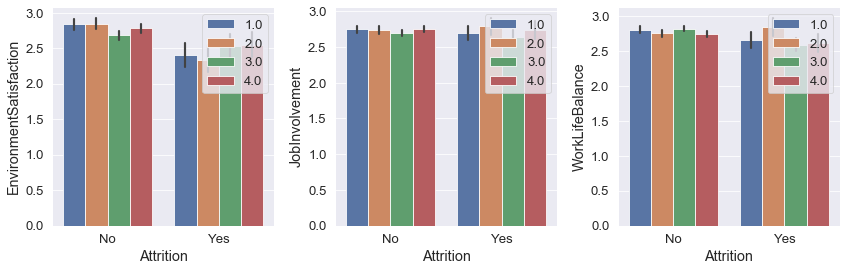

In [368]:
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
g = sns.barplot(df['Attrition'], df['EnvironmentSatisfaction'], hue=df['JobSatisfaction'])
plt.legend(loc ='upper right')
plt.subplot(1,3,2)
s = sns.barplot(df['Attrition'], df['JobInvolvement'], hue=df['JobSatisfaction'])
plt.legend(loc ='upper right')
plt.subplot(1,3,3)
f = sns.barplot(df['Attrition'], df['WorkLifeBalance'], hue=df['JobSatisfaction'])
plt.legend(loc ='upper right')
plt.tight_layout()

* 1.0 : Low
* 2.0 : Medium
* 3.0 : High
* 4.0 : Very High

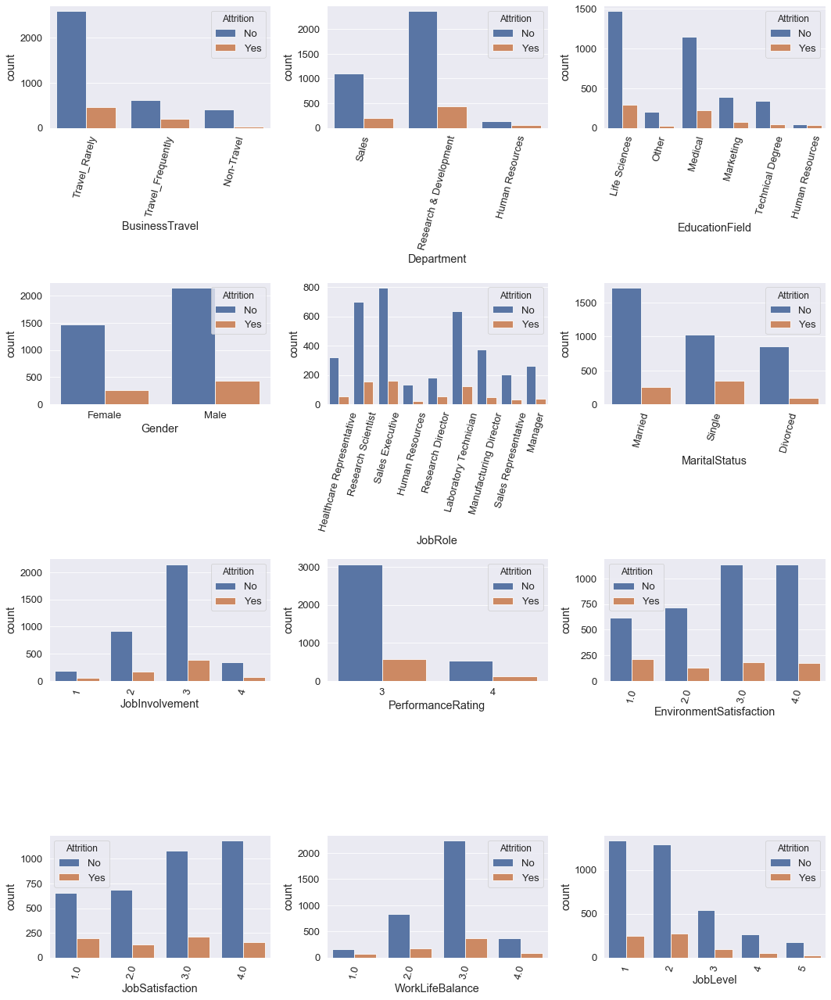

In [369]:
cat_cols = ['BusinessTravel', 'Department','EducationField', 'Gender',
       'JobRole', 'MaritalStatus','JobInvolvement', 'PerformanceRating',
       'EnvironmentSatisfaction', 'JobSatisfaction', 'WorkLifeBalance', 'JobLevel']
plt.figure(figsize=(15,18))
for i in range(len(cat_cols)):
    plt.subplot(4,3,i+1)
    sns.countplot(df[cat_cols[i]], hue=df['Attrition'])
    if len(df[cat_cols[i]].unique()) >= 3:
        plt.xticks(rotation=75)
plt.tight_layout()

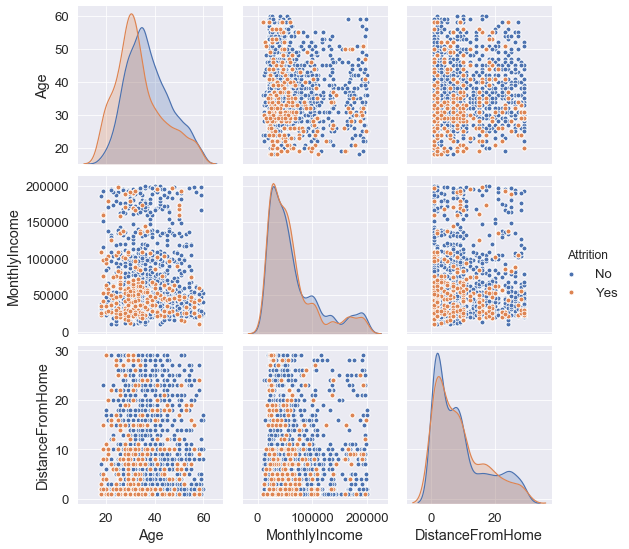

In [370]:
sns.pairplot(df[['Age','MonthlyIncome','DistanceFromHome','Attrition']],hue = 'Attrition')

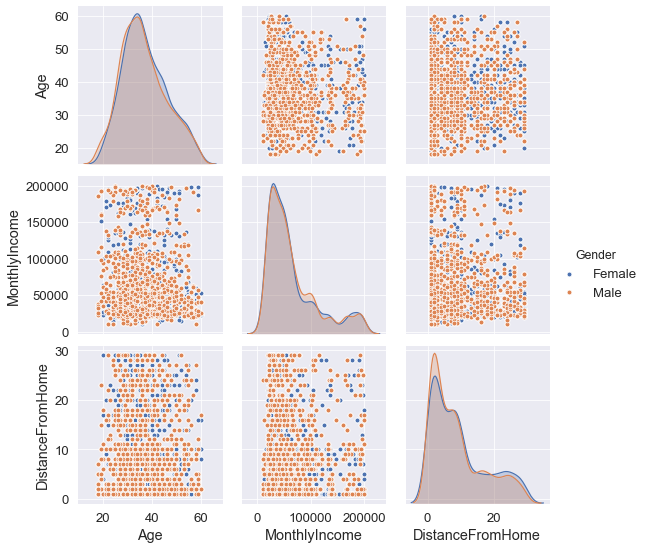

In [371]:
sns.pairplot(df[['Age','MonthlyIncome','DistanceFromHome','Gender']],hue = 'Gender')

### Summary of the categorical variables:
* BusinessTravel seems to have a bit of an influence on attrition.those who travel frequently have an attrition ratio of 0.331731 - Probably those who travel a lot for business purposes are having more stress and thus willing to leave


* Department doesn't seem to be correlated strongly but Human Resources attrition ratio is quite high at 0.431818 - maybe that's because of the low salary, we'll check this one later 


* EducationField seems to be a related to Department in some way, for Human Resources the ratio is 0.687500


* Gender doesn't seem correlated - Male attrition ratio is 0.200000 - not significantly more than females


* JobRole - the attrition ratio for Research Director is 0.311475 - that's not surprising considering the fact that the largest department is Research and Development. Research director is a role with a lot of responsibility,and that definetely can contribute to the the overall fatigue and burnout.


* MaritalStatus - Single status has a slightly bigger ratio with 0.342857 - maybe mediated by low salary/short term job


* JobInvolvement - category 1 ratio is 0.276923 - not surprising but isn't much higher than the other categories


* PerformanceRating - category 4 ratio 0.221622 - probably those who work the hardest, but again no significantly higher


* EnvironmentSatisfaction - here the difference is quite big, the category 1.0 attrition ratio is 0.339117 - it's pretty normal in my opinion. those who aren't satisfied with their work are not going to stay for long


* JobSatisfaction - category 1.0 ratio is 0.297134 - same explanation but here it's not significantly higher in my opinion


* WorkLifeBalance - here, simillarly to enviroment satisfaction, the gap is quite big, for category 1.0 the ratio is 0.457317 - the reasonable explanation is that people with low work/life balance are strongly prone to burnout, have more stress, etc..


* JobLevel - category 2 ratio 0.216401 - very simillar to other categories therefore doesn;t have a strong impact.

* ### Visualizing Numeric Data

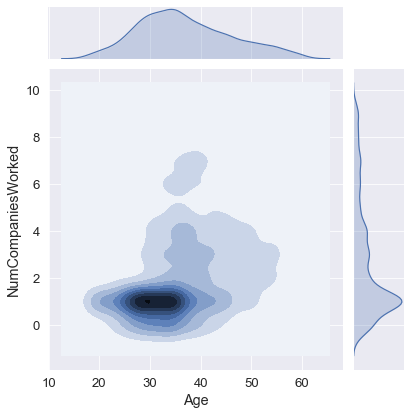

In [372]:
sns.jointplot(df['Age'], df['NumCompaniesWorked'], data=df, kind='kde')

Most employees have worked in 1-2 companies, aged between 28-35 (roughly).

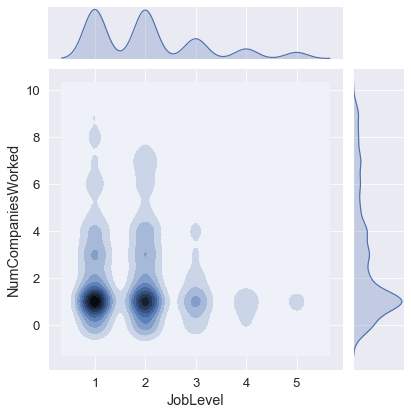

In [373]:
sns.jointplot(df['JobLevel'], df['NumCompaniesWorked'], data=df, kind='kde')

Most employees have worked in 1-2 companies have low job levels

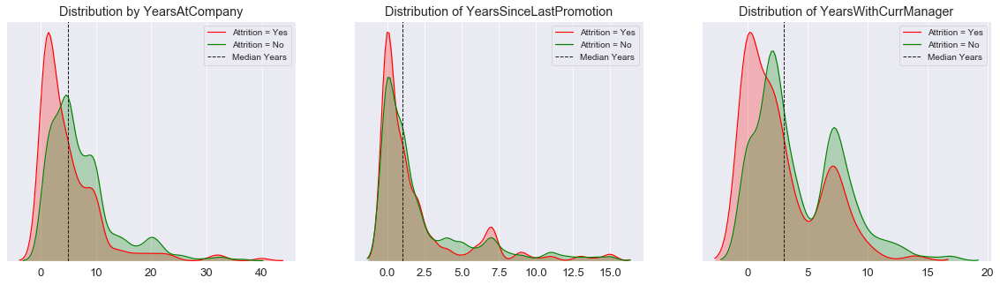

In [374]:
sns.set(context="paper", font_scale=1.5)
plt.figure(figsize=(20,5))

plt.subplot(1,3,1)
sns.kdeplot(data= df['YearsAtCompany'][df.Attrition == 'Yes'], color='red', shade=True)
sns.kdeplot(data= df['YearsAtCompany'][df.Attrition == 'No'], color='green', shade=True)
plt.axvline(df['YearsAtCompany'].median(), color='k', linestyle='dashed', linewidth=1)
plt.legend(['Attrition = Yes' , 'Attrition = No', 'Median Years'],prop={'size': 10})
plt.yticks([])
plt.title('Distribution by YearsAtCompany')

plt.subplot(1,3,2)
sns.kdeplot(data= df['YearsSinceLastPromotion'][df.Attrition == 'Yes'], color='red', shade=True)
sns.kdeplot(data= df['YearsSinceLastPromotion'][df.Attrition == 'No'], color='green', shade=True)
plt.axvline(df['YearsSinceLastPromotion'].median(), color='k', linestyle='dashed', linewidth=1)
plt.legend(['Attrition = Yes' , 'Attrition = No', 'Median Years'],prop={'size': 10})
plt.yticks([])
plt.title('Distribution of YearsSinceLastPromotion')

plt.subplot(1,3,3)
sns.kdeplot(data= df['YearsWithCurrManager'][df.Attrition == 'Yes'], color='red', shade=True)
sns.kdeplot(data= df['YearsWithCurrManager'][df.Attrition == 'No'], color='green', shade=True)
plt.axvline(df['YearsWithCurrManager'].median(), color='k', linestyle='dashed', linewidth=1)
plt.legend(['Attrition = Yes' , 'Attrition = No', 'Median Years'],prop={'size': 10})
plt.yticks([])
plt.title('Distribution of YearsWithCurrManager')

plt.show()

<b>Key Observations of Charts Above:</b> 
  
 
  a. Median YearsAtCompany is 5 years. Newer employees (who have spent lesser years in company) seem to have a higher risk of attrition.
  
  b. Median YearsSinceLastPromotion is 1 year. Employees who were recently promoted seem to have higher risk of attrition.
  
  c. Median YearsWithCurrManager is 3 years. Employees who have spent lesser years with current manager seem to have higher risk of attrition.

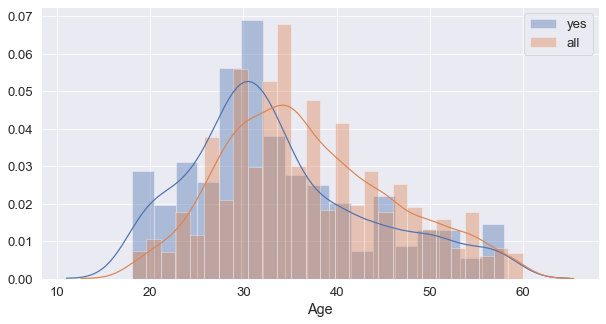

In [375]:
plt.subplots(figsize=(10,5))
sns.distplot(df[df['Attrition']=='Yes'].Age,label='yes')
sns.distplot(df.Age,label='all')
plt.legend()
plt.show()

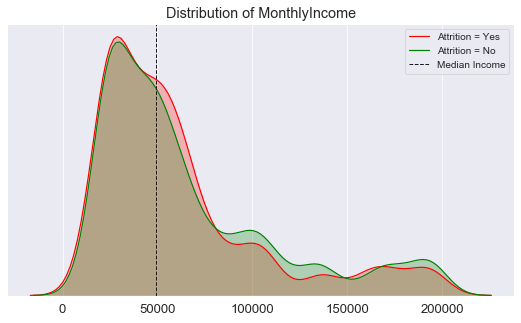

In [376]:
sns.set(context="paper", font_scale=1.5)
plt.figure(figsize=(20,5))

plt.subplot(1,2,1)
sns.kdeplot(data= df['MonthlyIncome'][df.Attrition == 'Yes'], color='red', shade=True)
sns.kdeplot(data= df['MonthlyIncome'][df.Attrition == 'No'], color='green', shade=True)
plt.axvline(df['MonthlyIncome'].median(), color='k', linestyle='dashed', linewidth=1)
plt.legend(['Attrition = Yes' , 'Attrition = No', 'Median Income'],prop={'size': 10})
plt.yticks([])
plt.title('Distribution of MonthlyIncome')

plt.show()

Median MonthlyIncome is around 50,000 Rupees. Employees who are paid lower than 80,000 Rupees seem to have a slightly higher risk of attrition. However, the observed difference is not as visually significant compared to features explored earlier.

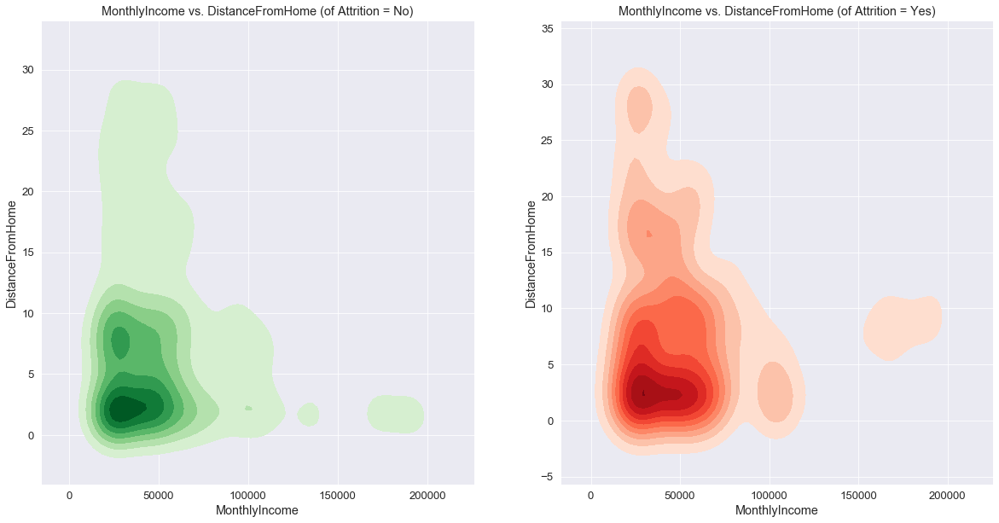

In [377]:
sns.set(context="paper", font_scale=1.5)
plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
sns.kdeplot(data=df['MonthlyIncome'][df.Attrition == 'No'], data2=df['DistanceFromHome'][df.Attrition == 'No'], cmap="Greens", shade=True, shade_lowest=False)
plt.title('MonthlyIncome vs. DistanceFromHome (of Attrition = No)')

plt.subplot(1,2,2)
sns.kdeplot(data=df['MonthlyIncome'][df.Attrition == 'Yes'], data2=df['DistanceFromHome'][df.Attrition == 'Yes'], cmap="Reds", shade=True, shade_lowest=False)
plt.title('Distribution of MonthlyIncome')
plt.title('MonthlyIncome vs. DistanceFromHome (of Attrition = Yes)')

plt.show()

a. Most of the employees who lived further away from office (more than 15 km) are paid around Median MonthlyIncome of 50,000 Rupees. They also exhibit higher risk of attrition.
  
b. Employees who are paid 3x more (i.e. more than 150,000 Rupees) than Median are also exhibiting higher risk of attrition if they live beyond 5 km of the office.

In [378]:
pd.crosstab(df['Attrition'],df['MaritalStatus'],margins=True,normalize=True)

MaritalStatus,Divorced,Married,Single,All
Attrition,,,,
No,0.198837,0.399535,0.240000,0.838372
Yes,0.021860,0.058372,0.081395,0.161628
All,0.220698,0.457907,0.321395,1.000000


In [379]:
from sklearn.preprocessing import LabelEncoder
labelEncoder_X = LabelEncoder()
data_labeled=df.copy()
data_labeled['Attrition'] = labelEncoder_X.fit_transform(data_labeled['Attrition'])
data_labeled['BusinessTravel'] = labelEncoder_X.fit_transform(data_labeled['BusinessTravel'])
data_labeled['Department'] = labelEncoder_X.fit_transform(data_labeled['Department'])
data_labeled['EducationField'] = labelEncoder_X.fit_transform(data_labeled['EducationField'])
data_labeled['Gender'] = labelEncoder_X.fit_transform(data_labeled['Gender'])
data_labeled['JobRole'] = labelEncoder_X.fit_transform(data_labeled['JobRole'])
data_labeled['MaritalStatus'] = labelEncoder_X.fit_transform(data_labeled['MaritalStatus'])


In [380]:
data_labeled.corr()['Attrition'].sort_values().to_frame()

,Attrition
TotalWorkingYears,-0.168637
Age,-0.155584
YearsWithCurrManager,-0.155420
YearsAtCompany,-0.133612
EnvironmentSatisfaction,-0.103485
JobSatisfaction,-0.103098
WorkLifeBalance,-0.059817
EducationField,-0.055620
TrainingTimesLastYear,-0.046239
Department,-0.044456


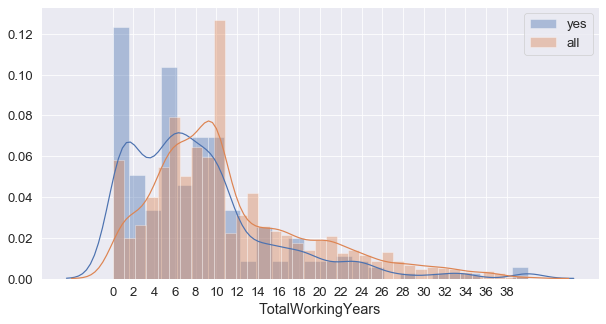

In [381]:
data_labeled.dropna(inplace=True)
ax=plt.figure(figsize=(10,5))
sns.distplot(data_labeled[data_labeled['Attrition']==1].TotalWorkingYears,label='yes')
sns.distplot(data_labeled.TotalWorkingYears,label='all')
plt.xticks(range(0,40,2))
plt.legend()
plt.show()

In [382]:
data_labeled[data_labeled.Age>40].corr()['Attrition']

EnvironmentSatisfaction   -0.125539
JobSatisfaction           -0.021097
WorkLifeBalance           -0.060418
JobInvolvement             0.062294
PerformanceRating          0.004860
Age                        0.042887
Attrition                  1.000000
BusinessTravel            -0.007543
Department                -0.017989
DistanceFromHome           0.024490
Education                  0.007575
EducationField             0.024692
Gender                     0.000482
JobLevel                  -0.006060
JobRole                    0.053967
MaritalStatus              0.084700
MonthlyIncome             -0.020140
NumCompaniesWorked         0.084549
PercentSalaryHike         -0.009985
StockOptionLevel           0.006319
TotalWorkingYears         -0.101955
TrainingTimesLastYear     -0.097360
YearsAtCompany             0.007207
YearsSinceLastPromotion    0.051307
YearsWithCurrManager      -0.031213
in_avg                     0.012790
out_avg                    0.127262
avg_work_day               0

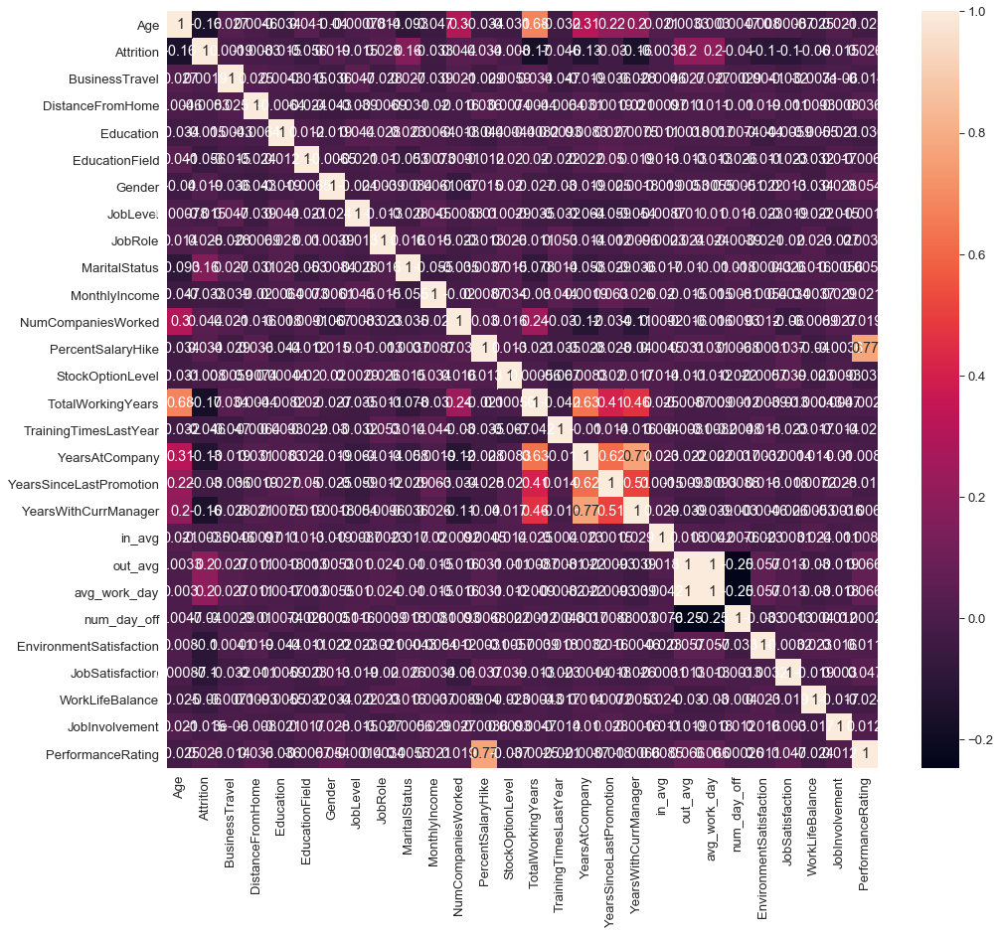

In [383]:
corr_cols = ['Age','Attrition','BusinessTravel','DistanceFromHome','Education', 'EducationField','Gender', 'JobLevel', 'JobRole',
       'MaritalStatus', 'MonthlyIncome', 'NumCompaniesWorked',
       'PercentSalaryHike', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'YearsAtCompany', 'YearsSinceLastPromotion',
       'YearsWithCurrManager','in_avg','out_avg','avg_work_day','num_day_off','EnvironmentSatisfaction','JobSatisfaction','WorkLifeBalance','JobInvolvement','PerformanceRating']
corr = data_labeled[corr_cols].corr()
plt.figure(figsize=(16,14))
sns.heatmap(corr, annot =True)
plt.show()

In [384]:
y = data_labeled['Attrition']
x = data_labeled.drop('Attrition', axis = 1)

In [385]:
y[5]

0

In [386]:
print(x.shape)
print(y.shape)

(4300, 28)
(4300,)


In [387]:
x.info

<bound method DataFrame.info of       EnvironmentSatisfaction  JobSatisfaction  WorkLifeBalance  \
0                         3.0              4.0              2.0   
1                         3.0              2.0              4.0   
2                         2.0              2.0              1.0   
3                         4.0              4.0              3.0   
4                         4.0              1.0              3.0   
...                       ...              ...              ...   
4295                      3.0              4.0              3.0   
4296                      4.0              1.0              3.0   
4297                      4.0              4.0              3.0   
4298                      1.0              3.0              3.0   
4299                      4.0              1.0              3.0   

      JobInvolvement  PerformanceRating  Age  BusinessTravel  Department  \
0                  3                  3   51               2           2   
1          

In [388]:
from sklearn.model_selection import train_test_split
X_train,X_test, y_train, y_test = train_test_split(x,y, test_size = 0.20, random_state=1)

In [389]:
from sklearn.preprocessing import StandardScaler
Scaler_X = StandardScaler()
X_train = Scaler_X.fit_transform(X_train)
X_test = Scaler_X.transform(X_test)

In [390]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score, roc_curve, auc, recall_score
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score, roc_curve, auc, recall_score
from sklearn.model_selection import GridSearchCV

LOGISTIC REGRESION

In [391]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
lr.fit(X_train,y_train)
y_pred = lr.predict(X_test)

# print(accuracy_score(y_test,y_pred))
# print(confusion_matrix(y_test,y_pred))

In [392]:
lraccuracy = accuracy_score(y_test, y_pred)

fpr, tpr, thresholds = roc_curve(y_test, y_pred)
lrroc_auc = auc(fpr, tpr)

lrf1_score = f1_score(y_test, y_pred)

lrrecall = recall_score(y_test, y_pred)

print('Model Accuracy: ', lraccuracy)
print('ROC_AUC Score: ', lrroc_auc)
print('F1 Score: ', lrf1_score)
print('Recall Score: ', lrrecall)

Model Accuracy:  0.8604651162790697
ROC_AUC Score:  0.6016859852476291
F1 Score:  0.33333333333333337
Recall Score:  0.23076923076923078


CONFUSION MATRIX

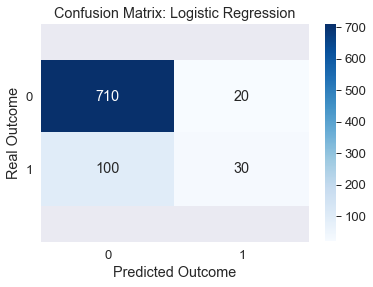

In [393]:
sns.set(context="paper", font_scale=1.5)
lrtunedcm = confusion_matrix(y_test, y_pred)

ax = heatmap = sns.heatmap(lrtunedcm, cmap="Blues", annot= True,fmt=".0f")
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.title('Confusion Matrix: Logistic Regression')
plt.ylabel('Real Outcome')
plt.xlabel('Predicted Outcome')
plt.yticks(rotation=0)
plt.show()


In [394]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.88      0.97      0.92       730
           1       0.60      0.23      0.33       130

    accuracy                           0.86       860
   macro avg       0.74      0.60      0.63       860
weighted avg       0.83      0.86      0.83       860



#### F1 score for 1 is very low (100 employees are predicted 0 when they are actually leaving).
#### Therefore, for tuning the model it is desired to take equal number of true and false examples

In [395]:
lrtuned = LogisticRegression(random_state=1, class_weight="balanced")
lrtuned.fit(X_train, y_train)
y_pred = lrtuned.predict(X_test)

In [396]:
lrtunedaccuracy = accuracy_score(y_test, y_pred)

fpr, tpr, thresholds = roc_curve(y_test, y_pred)
lrtunedroc_auc = auc(fpr, tpr)

lrtunedf1_score = f1_score(y_test, y_pred)

lrtunedrecall = recall_score(y_test, y_pred)

print('Model Accuracy: ', lrtunedaccuracy)
print('ROC_AUC Score: ', lrtunedroc_auc)
print('F1 Score: ', lrtunedf1_score)
print('Recall Score: ', lrtunedrecall)

Model Accuracy:  0.6988372093023256
ROC_AUC Score:  0.6993150684931506
F1 Score:  0.41269841269841273
Recall Score:  0.7


In [397]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.93      0.70      0.80       730
           1       0.29      0.70      0.41       130

    accuracy                           0.70       860
   macro avg       0.61      0.70      0.61       860
weighted avg       0.83      0.70      0.74       860



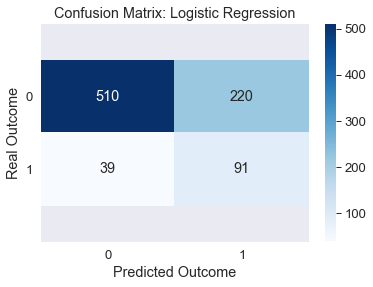

In [278]:
sns.set(context="paper", font_scale=1.5)
lrtunedcm = confusion_matrix(y_test, y_pred)

ax = heatmap = sns.heatmap(lrtunedcm, cmap="Blues", annot= True,fmt=".0f")
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.title('Confusion Matrix: Logistic Regression')
plt.ylabel('Real Outcome')
plt.xlabel('Predicted Outcome')
plt.yticks(rotation=0)
plt.show()


In [279]:
import statsmodels.api as sm

logistic_model = sm.GLM(y_train,(sm.add_constant(x_train)), family = sm.families.Binomial())
logistic_model.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Attrition   No. Observations:                 3440
Model:                            GLM   Df Residuals:                     3417
Model Family:                Binomial   Df Model:                           22
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1525.0
Date:                Mon, 22 Nov 2021   Deviance:                       3050.0
Time:                        12:48:17   Pearson chi2:                 3.42e+03
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.6355      0.047    -34.915      0.000      -1.727      -1.544
x1            -0.0020      0.046     -0.044      0.965      -0.093       0.089
x2            -0.1013      0.046     -2.205      0.027      -0.191      -0.011
x3             0.0109      0.047      0.234      0.815      -0.080       0.102
x4             0.0569      0.047      1.215      0.224      -0.035       0.149
x5             0.0254      0.047      0.545      0.586      -0.066       0.117
x6            -0.0481      0.045     -1.064      0.287      -0.137       0.040
x7             0.0958      0.045      2.138      0.033       0.008       0.184
x8             0.0013      0.046      0.029      0.977      -0.089       0.091
x9             0.0220      0.046      0.477      0.634      -0.068       0.112
x10           -0.0119      0.046     -0.258      0.797      -0.103       0.079
x11           -0.0083      0.046     -0.180      0.857      -0.099       0.082
x12           -0.0266      0.046     -0.574      0.566      -0.118       0.064
x13           -0.1026      0.081     -1.270      0.204      -0.261       0.056
x14           -0.0655      0.047     -1.394      0.163      -0.157       0.027
x15            0.1180      0.072      1.650      0.099      -0.022       0.258
x16           -0.0270      0.058     -0.469      0.639      -0.140       0.086
x17           -0.0092      0.046     -0.201      0.841      -0.099       0.080
x18            0.0305      0.024      1.285      0.199      -0.016       0.077
x19            0.0306      0.024      1.290      0.197      -0.016       0.077
x20            0.0422      0.048      0.886      0.376      -0.051       0.136
x21           -0.0599      0.044     -1.351      0.177      -0.147       0.027
x22           -0.0061      0.031     -0.196      0.844      -0.067       0.055
x23            0.0456      0.035      1.293      0.196      -0.024       0.115
x24            0.0200      0.048      0.419      0.675      -0.074       0.114
==============================================================================
"""

Dropping columns with very high p-values and which are highly correlated

In [280]:
cols_todrop = ['JobLevel','Department','JobRole','NumCompaniesWorked','PercentSalaryHike','StockOptionLevel',
               'YearsWithCurrManager']

x = data_labeled.drop(['Attrition'], axis=1).reset_index(drop=True)
y = data_labeled['Attrition'].values
x.drop(cols_todrop, axis=1, inplace=True)
x.Age = pd.cut(x.Age, 4)

In [281]:
x = pd.get_dummies(x)

In [282]:
scaler = StandardScaler()
x = scaler.fit_transform(x)

In [283]:
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size = 0.8, random_state=42)

In [284]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier, VotingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve, train_test_split, RandomizedSearchCV
from sklearn import preprocessing
from sklearn.metrics import r2_score, accuracy_score, roc_auc_score, mean_squared_error

In [285]:
def get_scores(score1, score2):
    models = []
    models.append(('LR', LogisticRegression()))
    models.append(('LDA', LinearDiscriminantAnalysis()))
    models.append(('KNN', KNeighborsClassifier()))
    models.append(('CART', DecisionTreeClassifier()))
    models.append(('NB', GaussianNB()))
    models.append(('SVM', SVC()))
    models.append(('ADA', AdaBoostClassifier()))
    models.append(('GradientBooster', GradientBoostingClassifier()))
    models.append(('ExtraTrees', ExtraTreesClassifier()))
    models.append(('RandomForest', RandomForestClassifier()))
    cv_scores = []
    test_scores = []
    names = []
    stds = []
    differences = []
    #res = pd.DataFrame(columns = {'Model',score+('(train)'), 'Std', score+('(test_score)'), 'difference'})
    #res = res[['Model',score+('(train)'), 'Std', score+('(test_score)'), 'difference']]
    res = pd.DataFrame()
    for index, model in enumerate(models):
        kfold = StratifiedKFold(n_splits=7)
        cv_results = cross_val_score(model[1], x_train, y_train, cv=kfold, scoring=score1)
        cv_scores.append(cv_results)
        names.append(model[0])
        model[1].fit(x_train,y_train)
        predictions = model[1].predict(x_test)
        test_score = score2(predictions, y_test)
        test_scores.append(test_score)
        stds.append(cv_results.std())
        differences.append((cv_results.mean() - test_score))
        res.loc[index,'Model'] = model[0]
        res.loc[index,score1+('(train)')] = cv_results.mean()
        res.loc[index,score1+('(test_score)')] = test_score
        res.loc[index,'Std'] = cv_results.std()
        res.loc[index,'difference'] = cv_results.mean() - test_score
    return res

Selecting model giving highest accuracy on test data

In [286]:
get_scores('accuracy', accuracy_score)

,Model,accuracy(train),accuracy(test_score),Std,difference
0,LR,0.849416,0.844186,0.008040,0.005230
1,LDA,0.850580,0.843023,0.008649,0.007557
2,KNN,0.865991,0.875581,0.010316,-0.009591
3,CART,0.946803,0.973256,0.012890,-0.026453
4,NB,0.804652,0.808140,0.024921,-0.003487
5,SVM,0.886339,0.897674,0.005554,-0.011335
6,ADA,0.863370,0.850000,0.010922,0.013370
7,GradientBooster,0.894186,0.884884,0.007462,0.009302
8,ExtraTrees,0.983141,0.996512,0.004701,-0.013371
9,RandomForest,0.962212,0.974419,0.006766,-0.012207


RANDOM FOREST

In [287]:
params = {'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000]}
RandomForest = RandomForestClassifier()
randomgrid_forest = RandomizedSearchCV(estimator=RandomForest, param_distributions = params, 
                               cv=5, n_iter=25, scoring = 'accuracy',
                               n_jobs = 4, verbose = 3, random_state = 42,
                               return_train_score = True)
randomgrid_forest.fit(x_train,y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   12.6s
[Parallel(n_jobs=4)]: Done 125 out of 125 | elapsed:  1.5min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [288]:
randomgrid_forest.score(x_test, y_test)

0.9953488372093023

In [289]:
forest_preds = randomgrid_forest.predict(x_test)
roc_auc_score(forest_preds, y_test)

0.9972260748959778

In [290]:
randomgrid_forest.best_estimator_

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=40, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=600,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [291]:
def estimators_compare(model, cv_score, metrics_score):
    train_scores = []
    test_scores= []
    estimators = [80,100,200,400,600,800,1200]
    res = pd.DataFrame(columns = {'Number Of Estimators', 'train_score', 'test_score'})
    for ind, i in enumerate(estimators):
        mode = model(n_estimators=i)
        kfold = StratifiedKFold(n_splits=7)
        cv_results = cross_val_score(mode, x_train, y_train, cv=kfold, scoring=cv_score)
        mode.fit(x_train, y_train)
        predictions = mode.predict(x_test)
        train_score = cv_results.mean()
        train_scores.append(train_score)
        test_score = metrics_score(predictions, y_test)
        test_scores.append(test_score)
        res.loc[ind,'Number Of Estimators'] = i
        res.loc[ind,'train_score'] = train_score
        res.loc[ind,'test_score'] = test_score

    plt.plot(estimators, train_scores, color='red')
    plt.plot(estimators, test_scores, color='blue')
    legs = ['train', 'test']
    plt.legend(legs)
    return res

,test_score,Number Of Estimators,train_score
0,0.972093,80,0.958432
1,0.977907,100,0.958722
2,0.977907,200,0.959306
3,0.97907,400,0.960468
4,0.977907,600,0.96047
5,0.976744,800,0.961921
6,0.976744,1200,0.96105


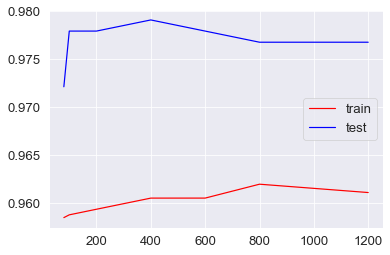

In [292]:
estimators_compare(RandomForestClassifier, 'accuracy', accuracy_score)

In [293]:
final_random_forest = RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=40, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
final_random_forest.fit(x_train, y_train)
final_random_forest.score(x_test, y_test)

0.9930232558139535

In [294]:
featuers_coefficients = final_random_forest.feature_importances_.tolist()
feature_names = x_copy.columns
feats = pd.DataFrame(pd.Series(featuers_coefficients, feature_names).sort_values(ascending=False),columns=['Coefficient'])
feats

,Coefficient
out_avg,0.102349
avg_work_day,0.100667
TotalWorkingYears,0.097776
MonthlyIncome,0.088281
YearsAtCompany,0.073966
DistanceFromHome,0.062800
EnvironmentSatisfaction,0.043471
MaritalStatus,0.042829
YearsSinceLastPromotion,0.042596
TrainingTimesLastYear,0.038490


EXTRA TREES

In [295]:
params2 = {'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000]}
ExtraTress = ExtraTreesClassifier()
randomgrid_extrees = RandomizedSearchCV(estimator=ExtraTress, param_distributions = params2, 
                               cv=5, n_iter=25, scoring = 'accuracy',
                               n_jobs = 4, verbose = 3, random_state = 42,
                               return_train_score = True)
randomgrid_extrees.fit(x_train,y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    6.8s
[Parallel(n_jobs=4)]: Done 125 out of 125 | elapsed:   51.4s finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=ExtraTreesClassifier(bootstrap=False,
                                                  ccp_alpha=0.0,
                                                  class_weight=None,
                                                  criterion='gini',
                                                  max_depth=None,
                                                  max_features='auto',
                                                  max_leaf_nodes=None,
                                                  max_samples=None,
                                                  min_impurity_decrease=0.0,
                                                  min_impurity_split=None,
                                                  min_samples_leaf=1,
                                                  min_samples_split=2,
                                                  min_weight_fraction_leaf=0.0,
                                        

In [296]:
randomgrid_extrees.score(x_test, y_test)

0.9965116279069768

In [297]:
randomgrid_extrees.best_estimator_

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=40, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=600,
                     n_jobs=None, oob_score=False, random_state=None, verbose=0,
                     warm_start=False)

,test_score,Number Of Estimators,train_score
0,0.996512,80,0.98285
1,0.996512,100,0.981978
2,0.996512,200,0.981979
3,0.996512,400,0.982269
4,0.996512,600,0.981978
5,0.996512,800,0.981687
6,0.996512,1200,0.982269


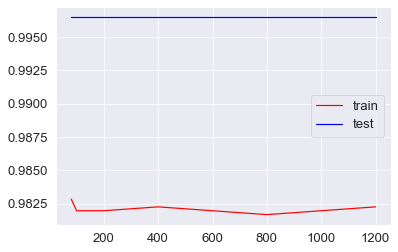

In [298]:
estimators_compare(ExtraTreesClassifier, 'accuracy', accuracy_score)

In [299]:
final_extra_trees_A = ExtraTreesClassifier(max_depth=40, max_features='sqrt', n_estimators=600)
final_extra_trees_A.fit(x_train, y_train)
print(final_extra_trees_A.score(x_test, y_test))
final_extra_trees_B = ExtraTreesClassifier(max_depth=40, max_features='sqrt', n_estimators=100)
final_extra_trees_B.fit(x_train, y_train)
print(final_extra_trees_B.score(x_test, y_test))

0.9965116279069768
0.9965116279069768


In [300]:
featuers_coefficients = final_extra_trees_A.feature_importances_.tolist()
feature_names = x_copy.columns
feats = pd.DataFrame(pd.Series(featuers_coefficients, feature_names).sort_values(ascending=False),columns=['Coefficient'])
feats

,Coefficient
avg_work_day,0.072805
out_avg,0.072597
TotalWorkingYears,0.071412
YearsAtCompany,0.068676
MonthlyIncome,0.054656
MaritalStatus,0.053838
DistanceFromHome,0.052868
EnvironmentSatisfaction,0.052420
JobSatisfaction,0.051618
YearsSinceLastPromotion,0.047432


Percent Plots of different features wrt attrition

In [326]:
def percent_plot(x):
    temp = df[['Attrition',x]]
    temp['Attrition'] = temp['Attrition'].map({'Yes':1 , 'No':0})
    grouped = temp.groupby(x).sum()
    grouped['Total'] = temp.groupby(x).count()
    row_count = df.shape[0]
    grouped['Percentage_Attrition'] = grouped['Attrition']*100/grouped['Total']
    pd.Series(grouped['Percentage_Attrition'],index = grouped.index).plot()
    title = 'Plotting '+x+' vs % of Attrition'
    plt.title(title)
    plt.xlabel(x)  
    plt.savefig('percent_'+x+'_.png', dpi=100)
    plt.ylabel('Percentage of  Attrition')

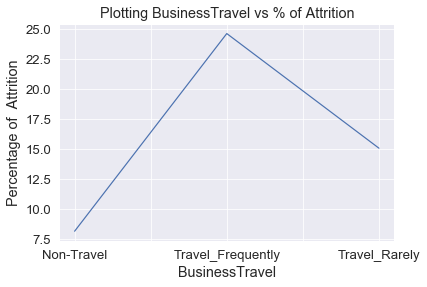

In [327]:
percent_plot('BusinessTravel')

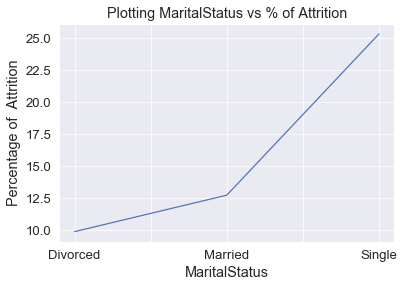

In [328]:
percent_plot('MaritalStatus')

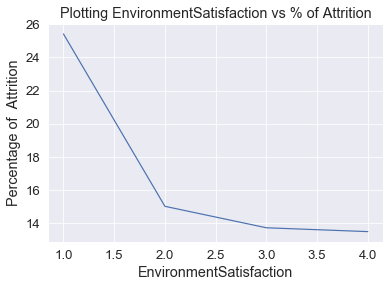

In [329]:
percent_plot('EnvironmentSatisfaction')

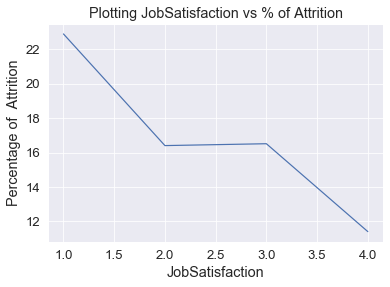

In [330]:
percent_plot('JobSatisfaction')

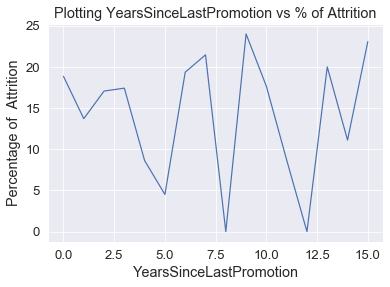

In [331]:
percent_plot('YearsSinceLastPromotion')

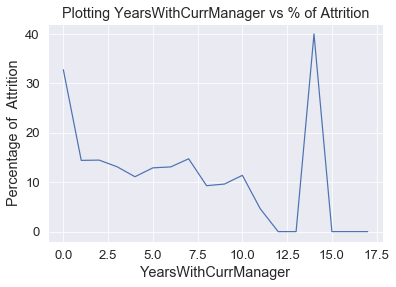

In [332]:
percent_plot('YearsWithCurrManager')

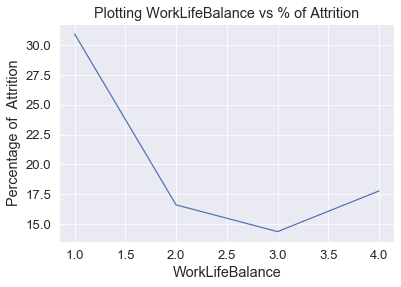

In [333]:
percent_plot('WorkLifeBalance')

### PDP REPORTS

In [310]:
df2 = df.copy()

Label Encoding for categorical variables

In [311]:
change = {
    'No': 0,
    'Yes': 1
}

df2['Attrition'] = df['Attrition'].map(change)
df2['Attrition'] = df2['Attrition'].astype('int64')


In [312]:
change = {
    'Non-Travel': 0,
    'Travel_Rarely': 1,
    'Travel_Frequently': 2
}

df2['BusinessTravel'] = df2['BusinessTravel'].map(change)
df2['BusinessTravel'] = df2['BusinessTravel'].astype('int64')
df2['BusinessTravel'].unique()

array([1, 2, 0], dtype=int64)

In [313]:
dum_df = pd.get_dummies(df2, columns=['Department'])
df2 =pd.concat([dum_df])
df2[:2]

,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating,Age,Attrition,BusinessTravel,DistanceFromHome,Education,...,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,in_avg,out_avg,avg_work_day,num_day_off,Department_Human Resources,Department_Research & Development,Department_Sales
0,3.0,4.0,2.0,3,3,51,0,1,6,2,...,1,0,0,9.994228,17.369048,7.374820,17,0,0,1
1,3.0,2.0,4.0,2,4,31,1,2,10,1,...,5,1,4,9.979574,17.695603,7.716028,13,0,1,0


In [314]:
change = {
    'Other': 0,
    'Life Sciences': 1,
    'Medical': 2,
    'Marketing': 3,
    'Technical Degree': 4,
    'Human Resources': 5,
}

df2['EducationField'] = df2['EducationField'].map(change)
df2['EducationField'] = df2['EducationField'].astype('int64')
df2['EducationField'].unique()

array([1, 0, 2, 3, 4, 5], dtype=int64)

In [315]:
dum_df = pd.get_dummies(df2, columns=['JobRole'])
df2 =pd.concat([dum_df])
df2[:2]

,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating,Age,Attrition,BusinessTravel,DistanceFromHome,Education,...,Department_Sales,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative
0,3.0,4.0,2.0,3,3,51,0,1,6,2,...,1,1,0,0,0,0,0,0,0,0
1,3.0,2.0,4.0,2,4,31,1,2,10,1,...,0,0,0,0,0,0,0,1,0,0


In [316]:
change = {
    'Male': 0,
    'Female': 1,
}

df2['Gender'] = df2['Gender'].map(change)
df2['Gender'] = df2['Gender'].astype('int64')
df2['Gender'].unique()

array([1, 0], dtype=int64)

In [317]:
change = {
    'Single': 0,
    'Divorced': 1,
    'Married': 2
}

df2['MaritalStatus'] = df2['MaritalStatus'].map(change)
df2['MaritalStatus'] = df2['MaritalStatus'].astype('int64')
df2['MaritalStatus'].unique()

array([2, 0, 1], dtype=int64)

DESCRIBING ALL ENCODED CATEGORICAL VARIABLES

In [318]:
desc = pd.DataFrame()
a = list(df2.columns)
for el in a:
    uniq = df2[el].unique()
    desc.loc[el, "values"] = str(uniq)

desc

,values
EnvironmentSatisfaction,[3. 2. 4. 1.]
JobSatisfaction,[4. 2. 1. 3.]
WorkLifeBalance,[2. 4. 1. 3.]
JobInvolvement,[3 2 4 1]
PerformanceRating,[3 4]
Age,[51 31 32 38 46 28 29 25 45 55 47 37 21 35 26 ...
Attrition,[0 1]
BusinessTravel,[1 2 0]
DistanceFromHome,[ 6 10 17 2 8 11 18 1 7 14 3 16 9 5 4 ...
Education,[2 1 4 5 3]


DIVIDING DATASET INTO NORMAL ATTRITIONS AND UNDESIRABLE ATTRITIONS

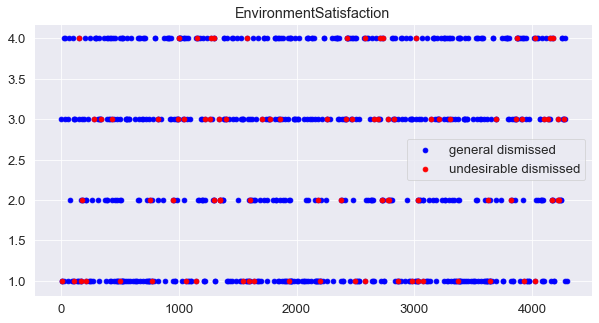

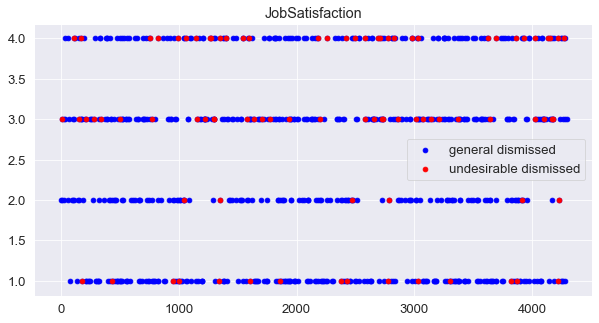

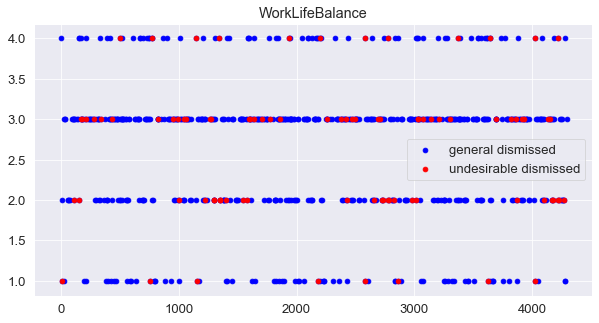

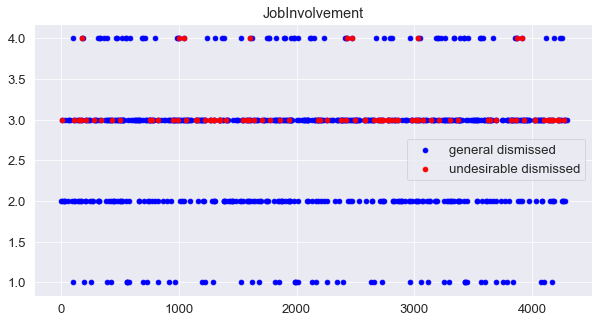

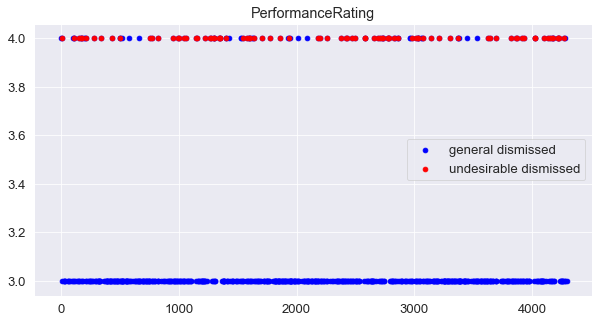

...

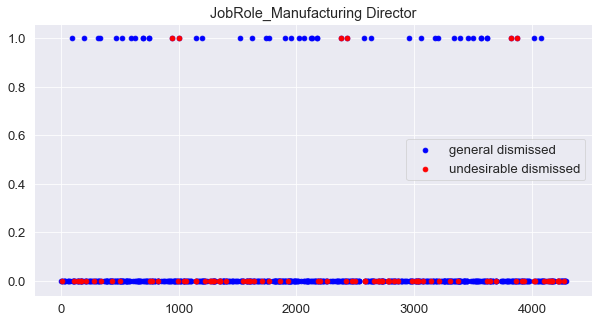

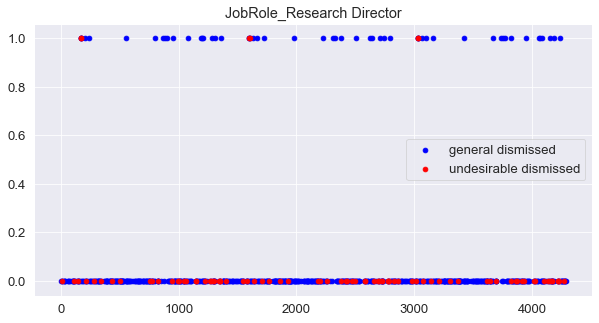

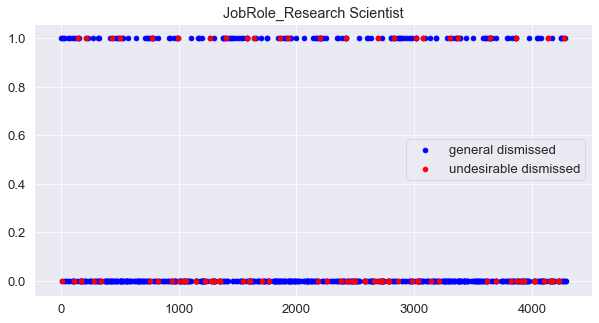

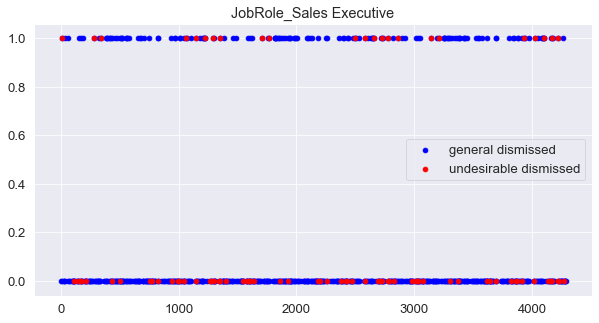

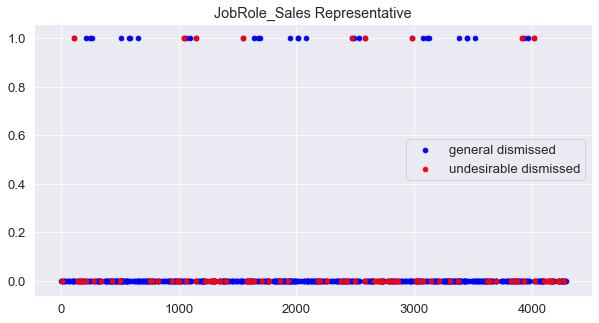

In [319]:
general_dism = df2.loc[df2['Attrition'] == 1]
undesirable_dism = df2.loc[(df2['Attrition'] == 1) & (df2['JobInvolvement'] >= 3) & (df2['PerformanceRating'] == 4)]

for col in df2.columns:
    plt.figure(figsize=(10, 5))
    plt.title(col)
    plt.scatter(general_dism.index, general_dism[col], label="general dismissed", color='blue')
    plt.scatter(undesirable_dism.index, undesirable_dism[col], label="undesirable dismissed", color='red')
    plt.legend()
    plt.show()

In [320]:
still_working = df2.loc[df2['Attrition'] == 0]
general_dism = df2.loc[df2['Attrition'] == 1]
undesirable_dism = df2.loc[(df2['Attrition'] == 1) & (df2['JobInvolvement'] >= 3) & (df2['PerformanceRating'] == 4)]

print('mean values of columns:')
print('                                                company         still working       general dismissed   undesirable dismissed\n')
print(f'Number                                           {df2.shape[0]}                 {still_working.shape[0]}                  {general_dism.shape[0]}                   {undesirable_dism.shape[0]}\n')

for col in df2.columns:
    comp = round(df2[col].mean(), 2)
    still = round(still_working[col].mean(), 2)
    gen = round(general_dism[col].mean(), 2)
    undes = round(undesirable_dism[col].mean(),2)
    print("{:35s} {:20.2f} {:20.2f} {:20.2f} {:20.2f} ".format(col, comp, still, gen, undes))

mean values of columns:
                                                company         still working       general dismissed   undesirable dismissed

Number                                           4300                 3605                  695                   86

EnvironmentSatisfaction                             2.72                 2.77                 2.47                 2.43 
JobSatisfaction                                     2.72                 2.77                 2.47                 2.97 
WorkLifeBalance                                     2.76                 2.78                 2.66                 2.64 
JobInvolvement                                      2.73                 2.73                 2.71                 3.10 
PerformanceRating                                   3.15                 3.15                 3.18                 4.00 
Age                                                36.93                37.55                33.69                34.31 
Attri

SHAP values for checking impact on model output

['PerformanceRating']


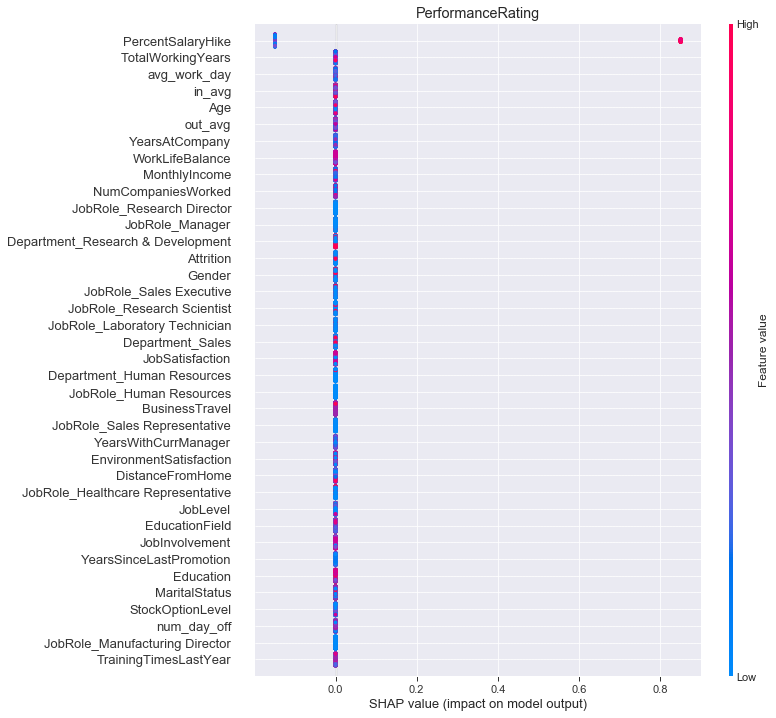

['JobSatisfaction']


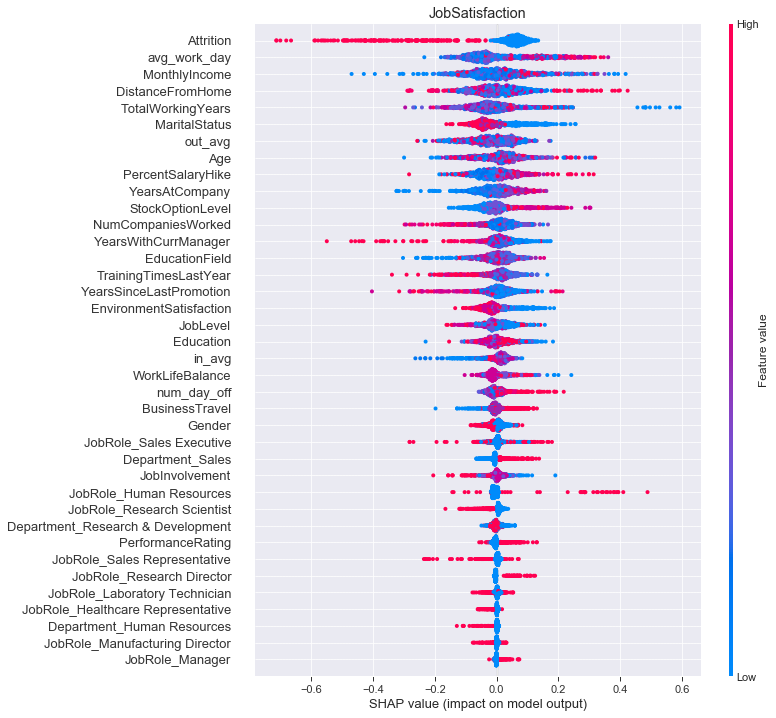

['JobInvolvement']


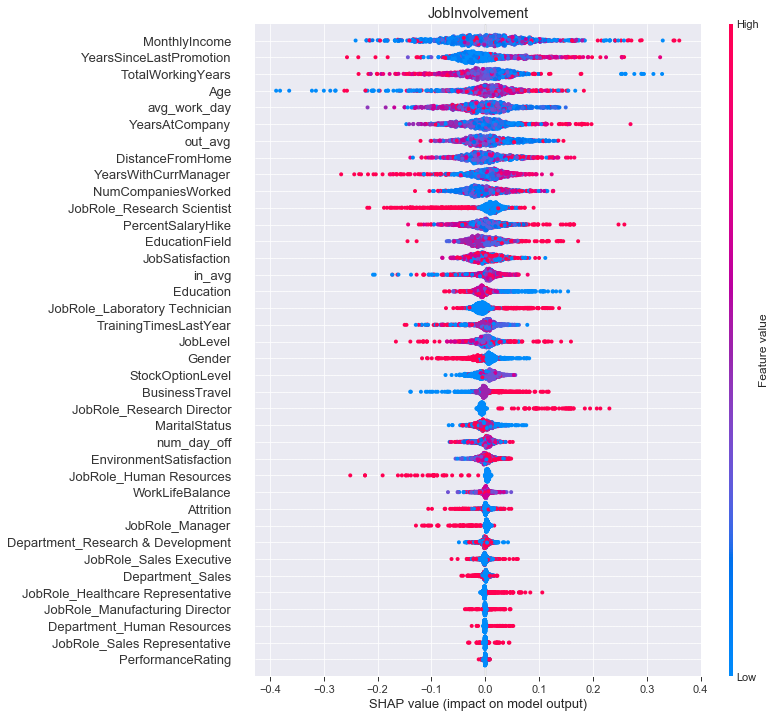

['EnvironmentSatisfaction']


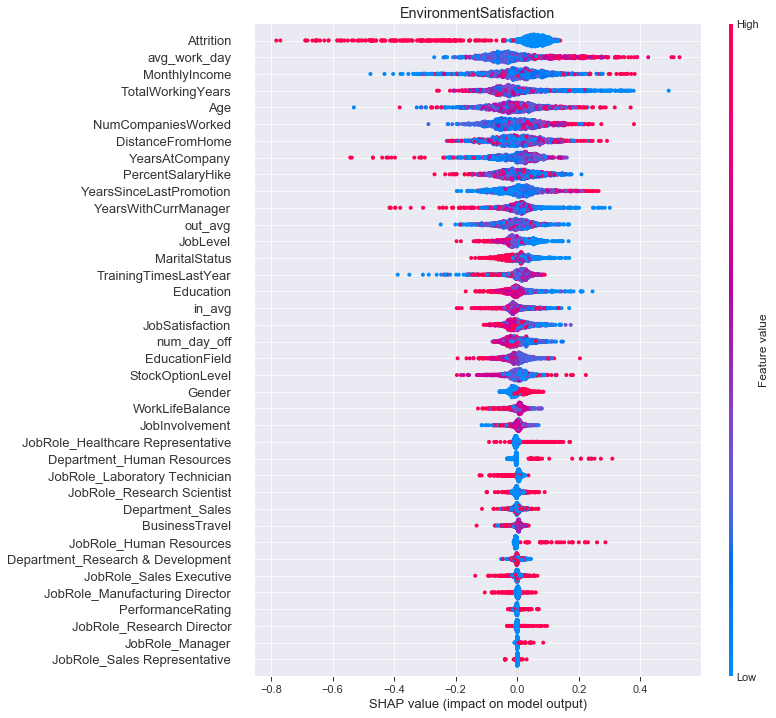

['Attrition']


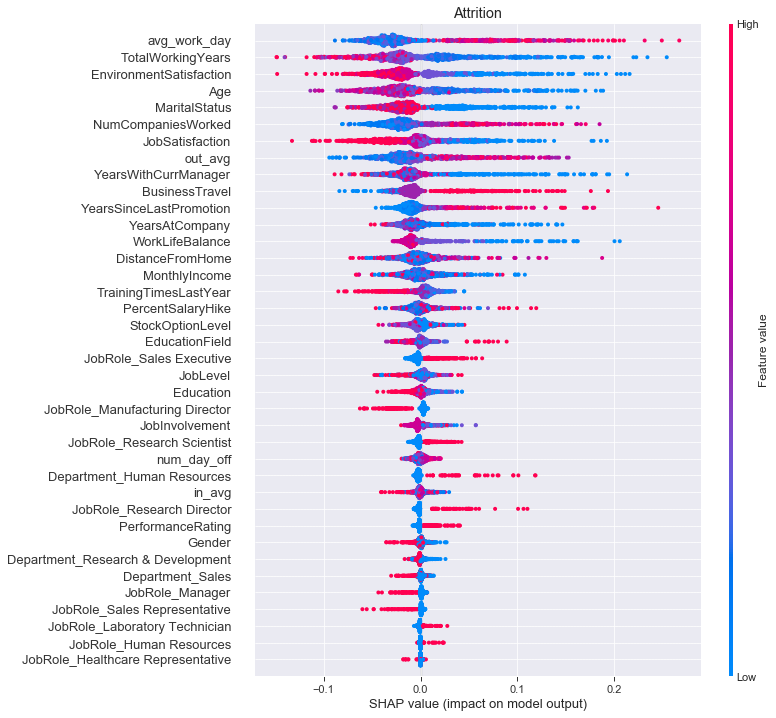

['YearsAtCompany']


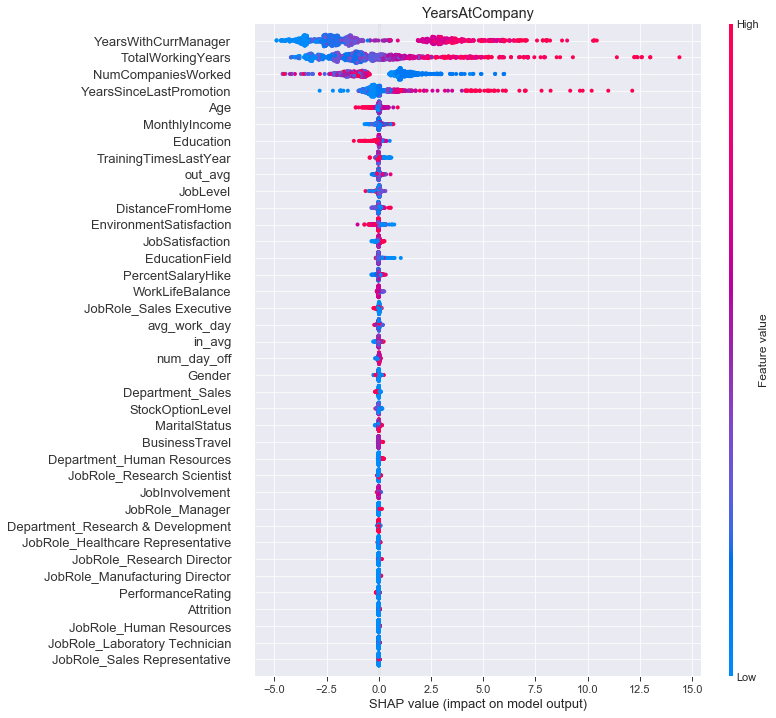

['MonthlyIncome']


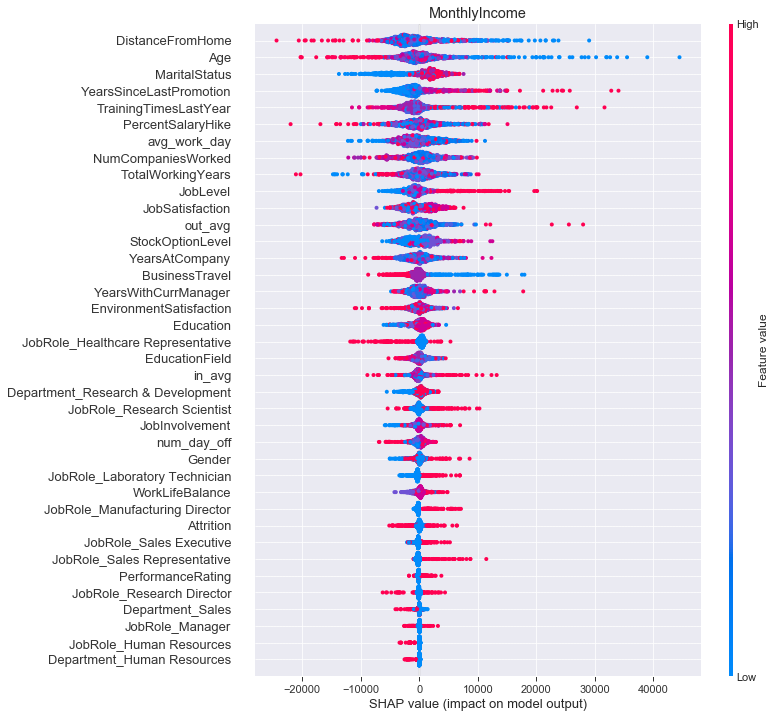

['StockOptionLevel']


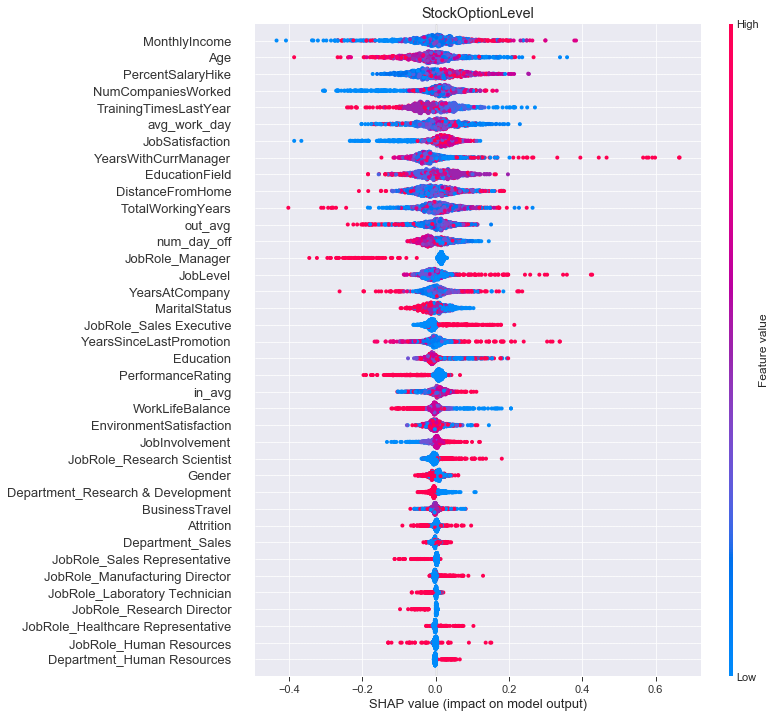

['PercentSalaryHike']


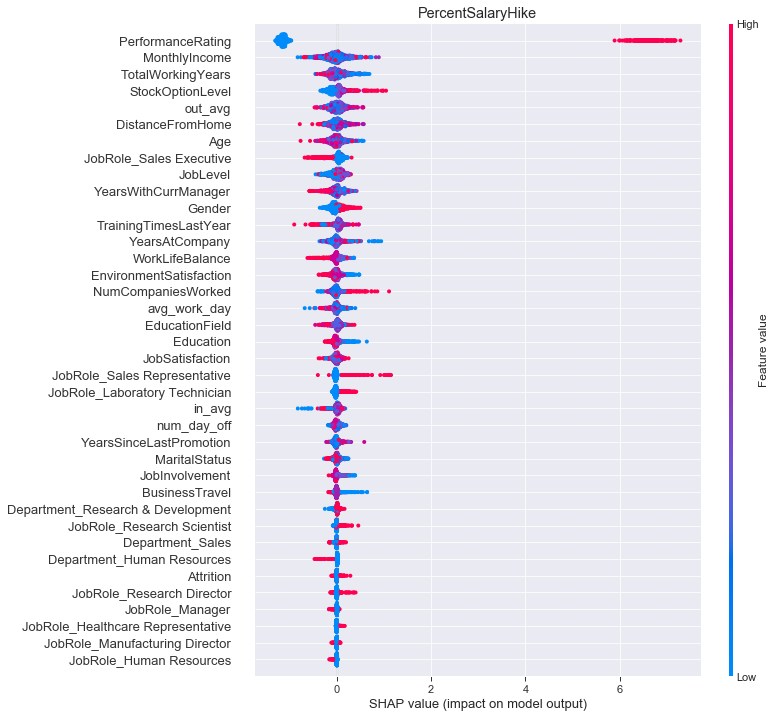

['YearsWithCurrManager']


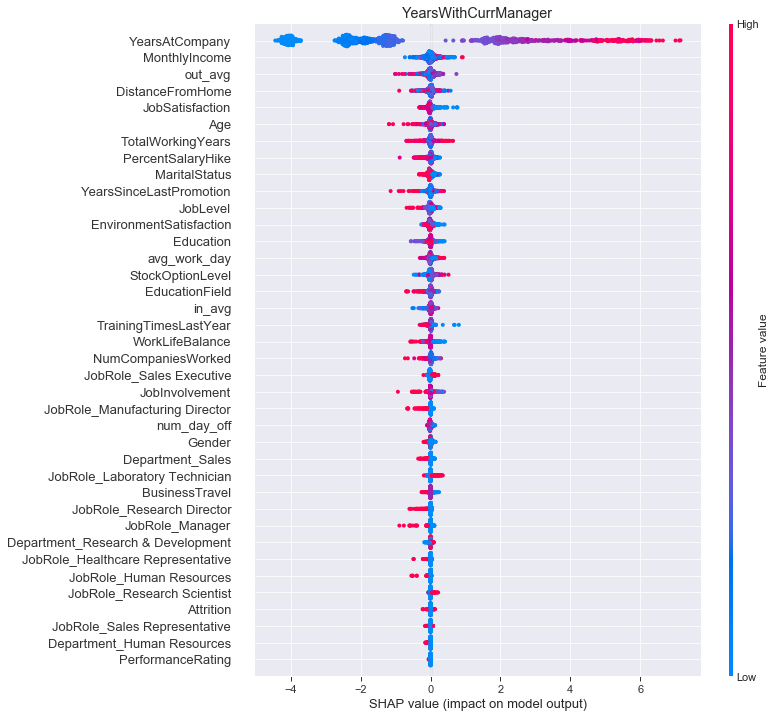

['Education']


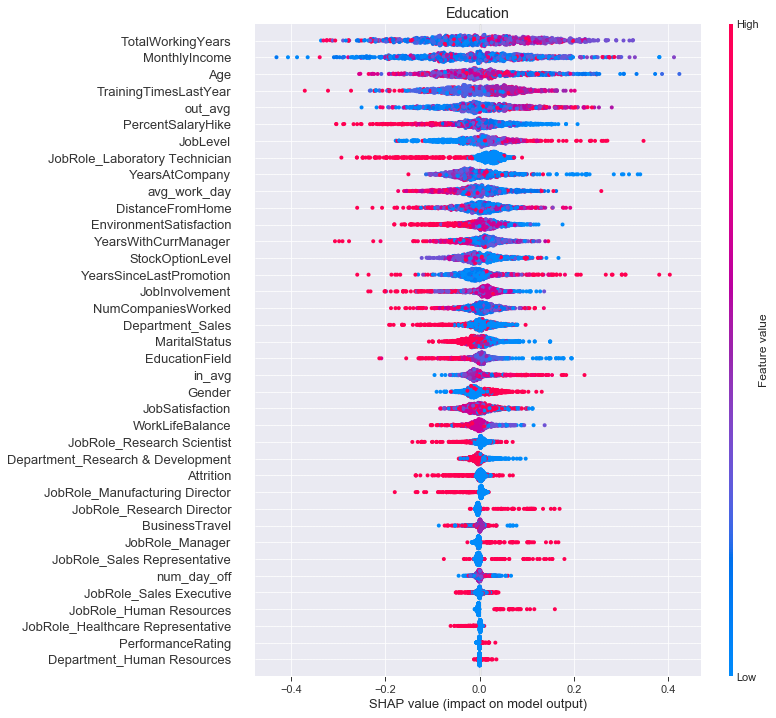

['WorkLifeBalance']


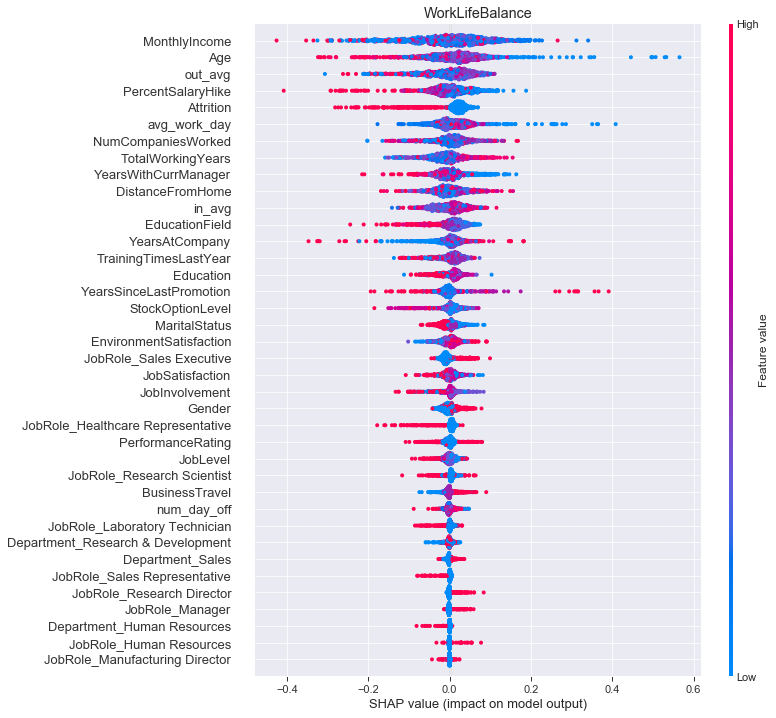

['MaritalStatus']


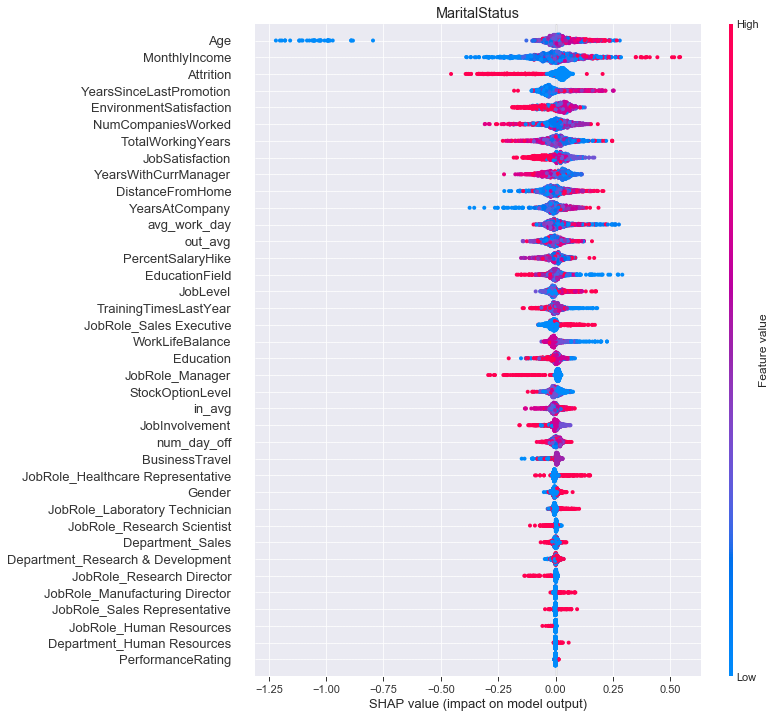

['JobLevel']


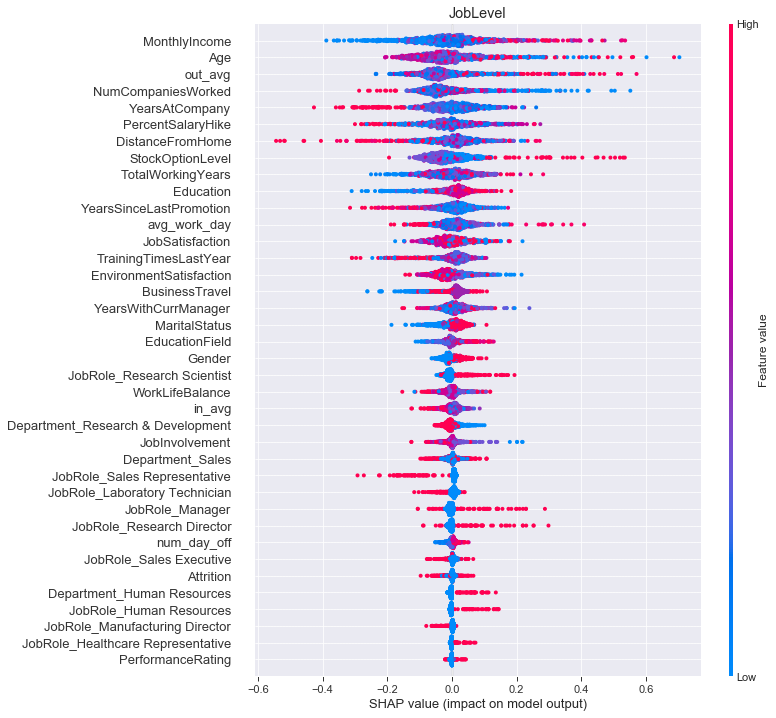

['DistanceFromHome']


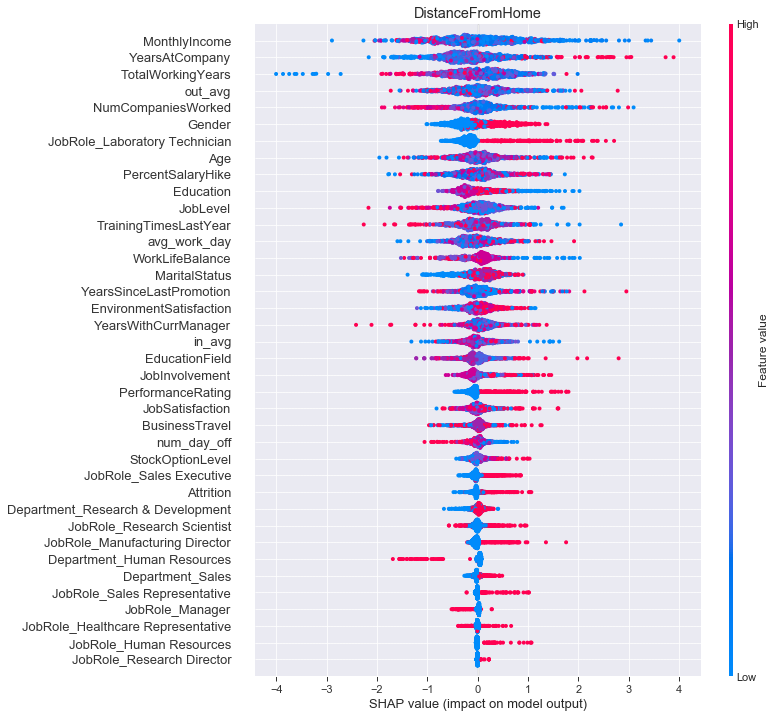

['TotalWorkingYears']


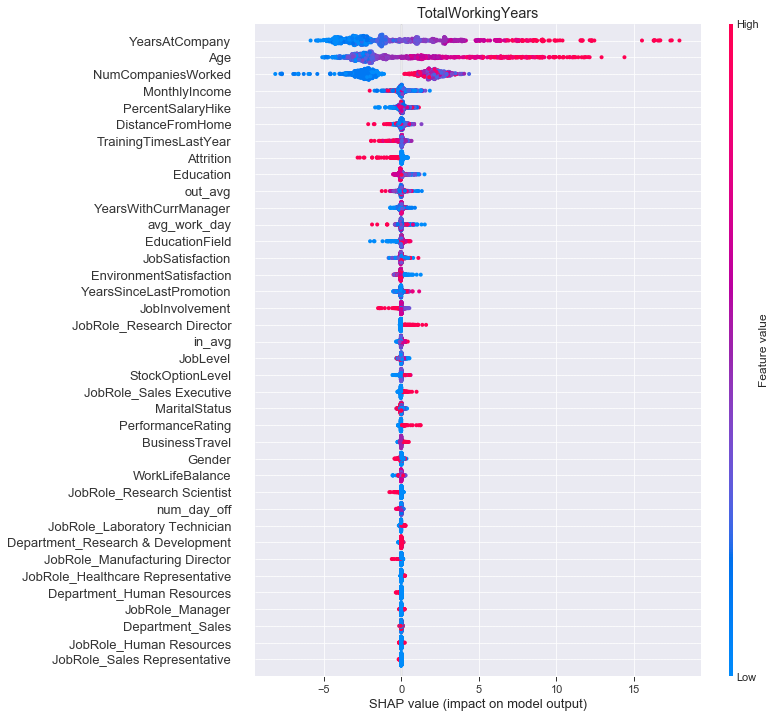

['TrainingTimesLastYear']


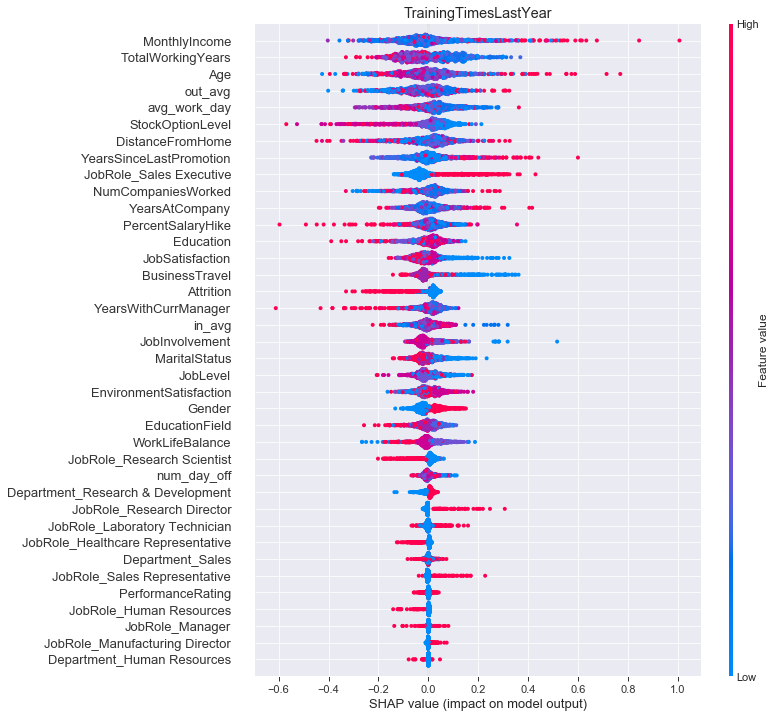

['BusinessTravel']


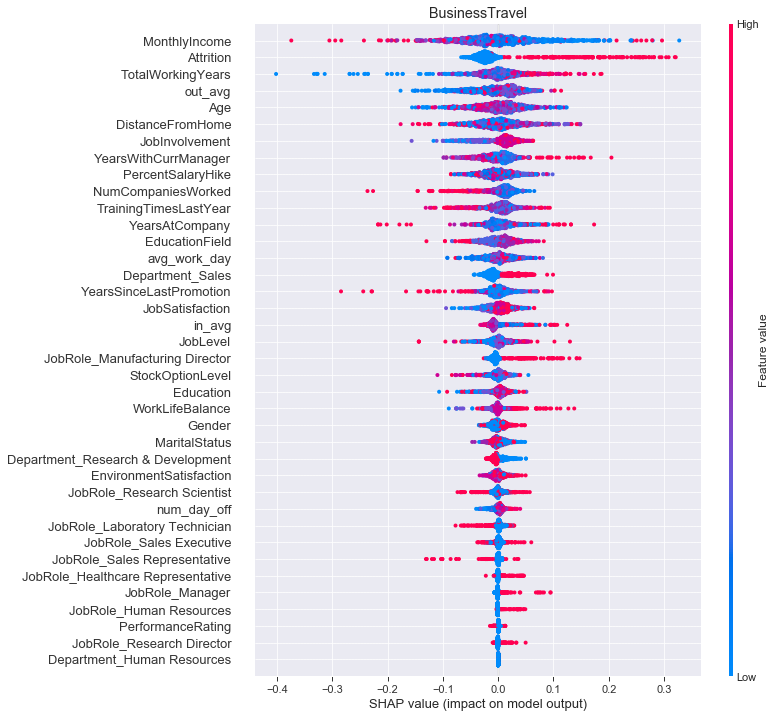

['EducationField']


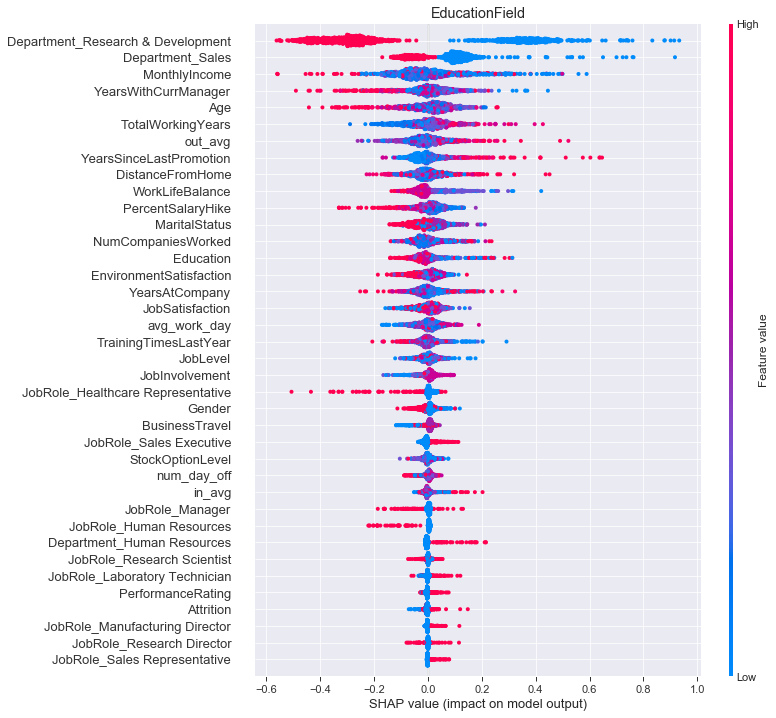

['NumCompaniesWorked']


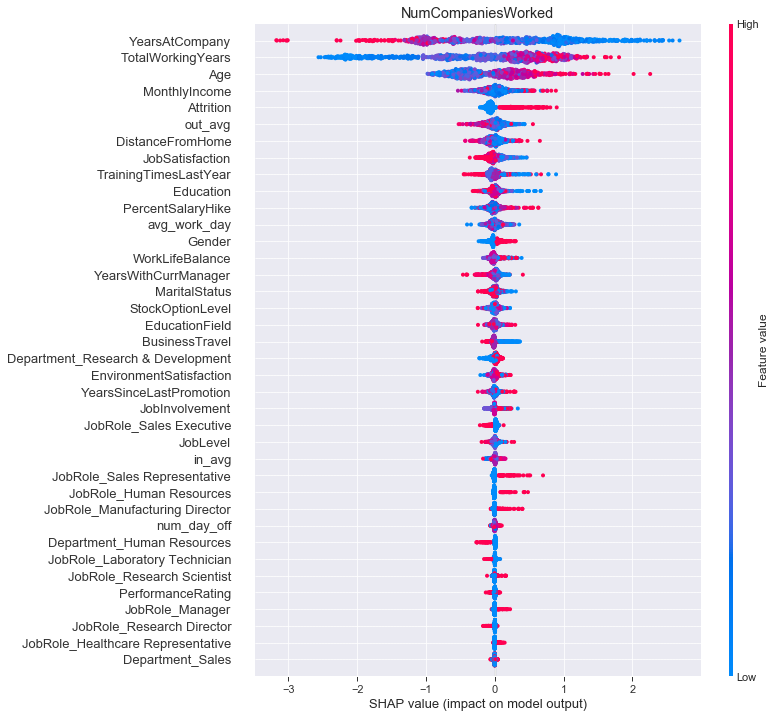

['YearsSinceLastPromotion']


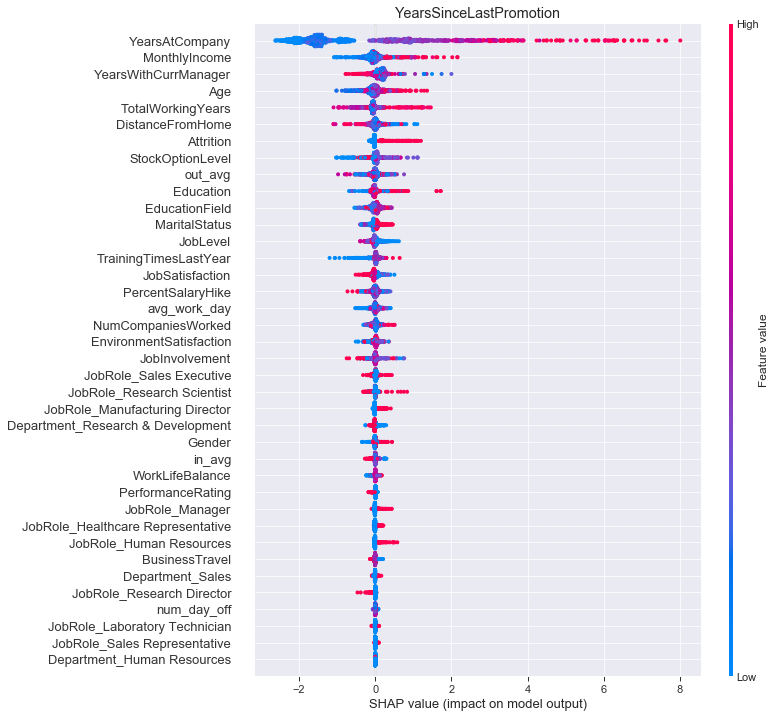

['avg_work_day']


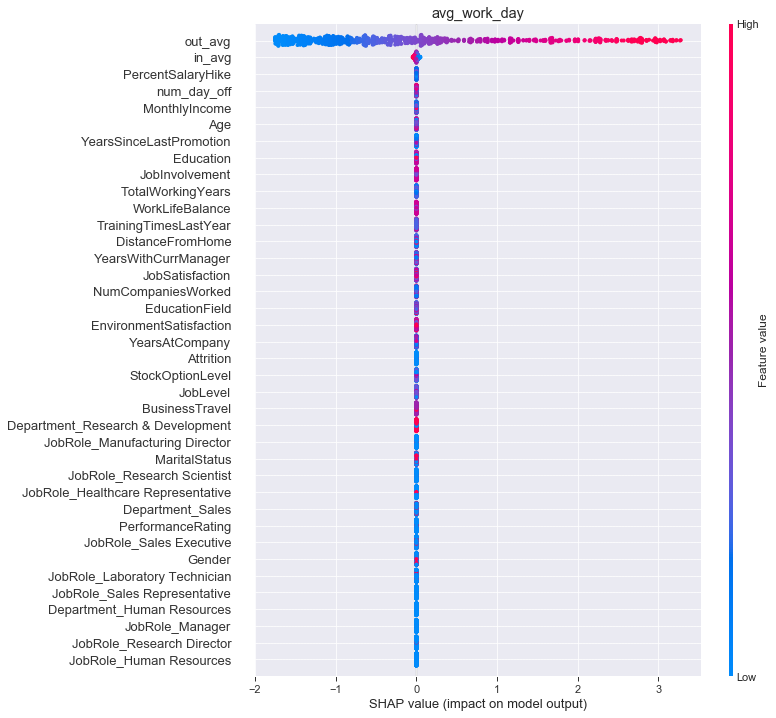

['num_day_off']


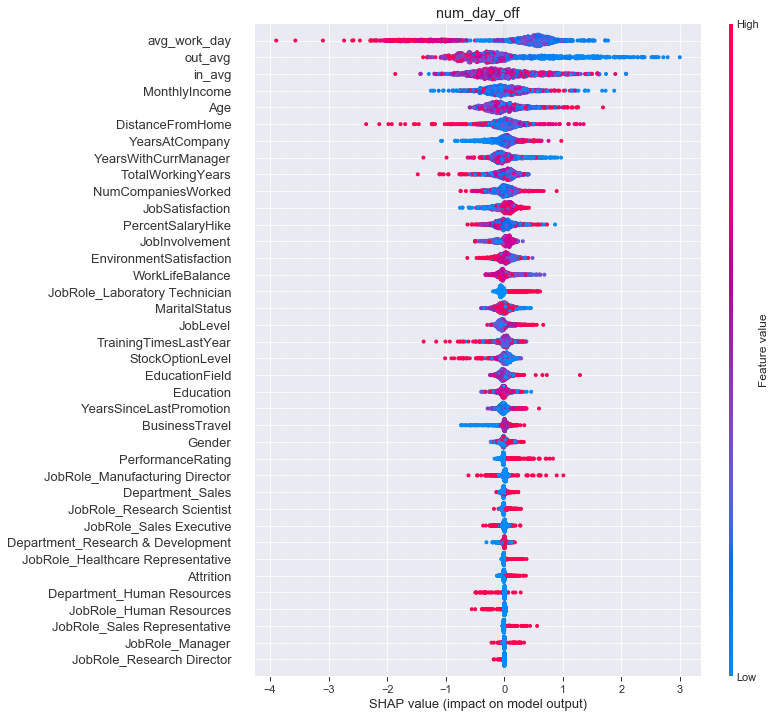

['in_avg']


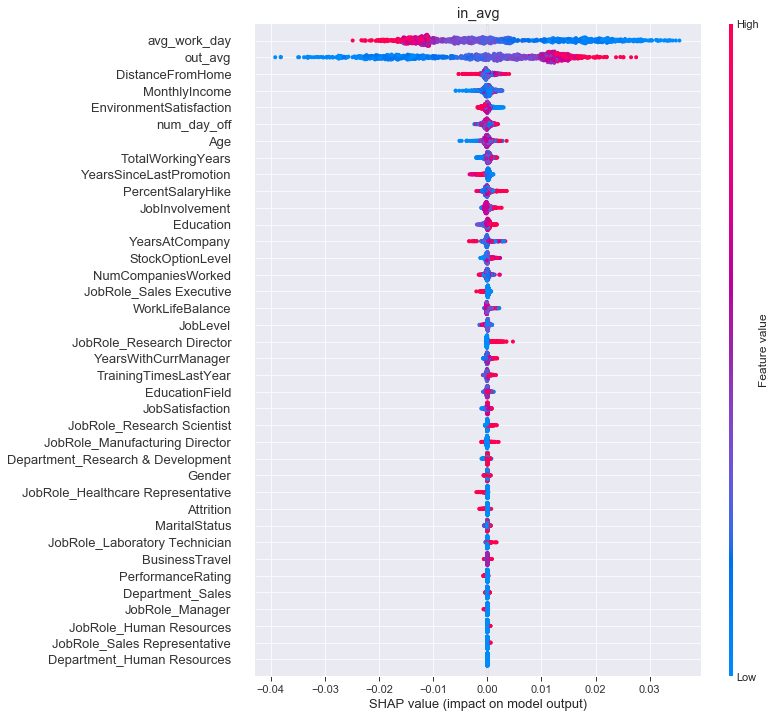

['out_avg']


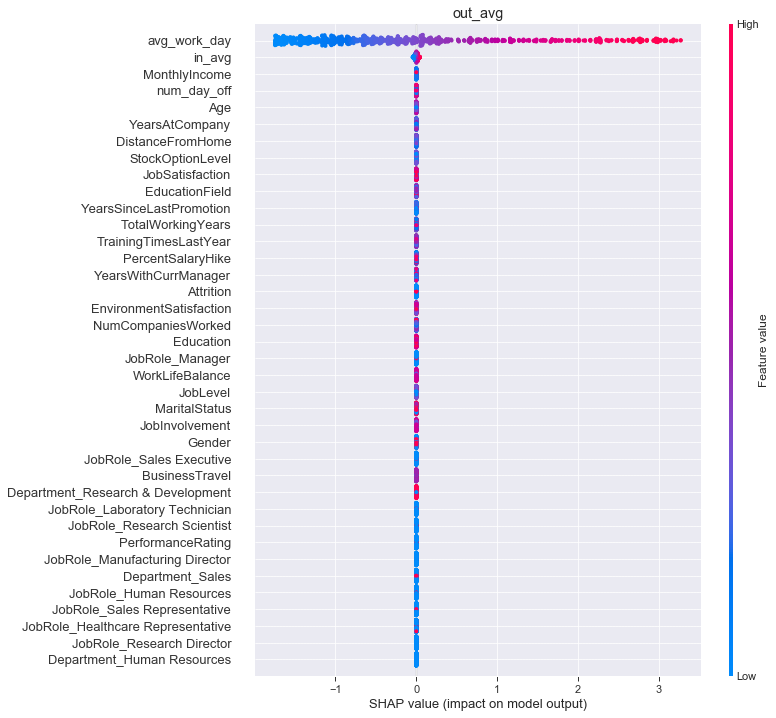

['Age']


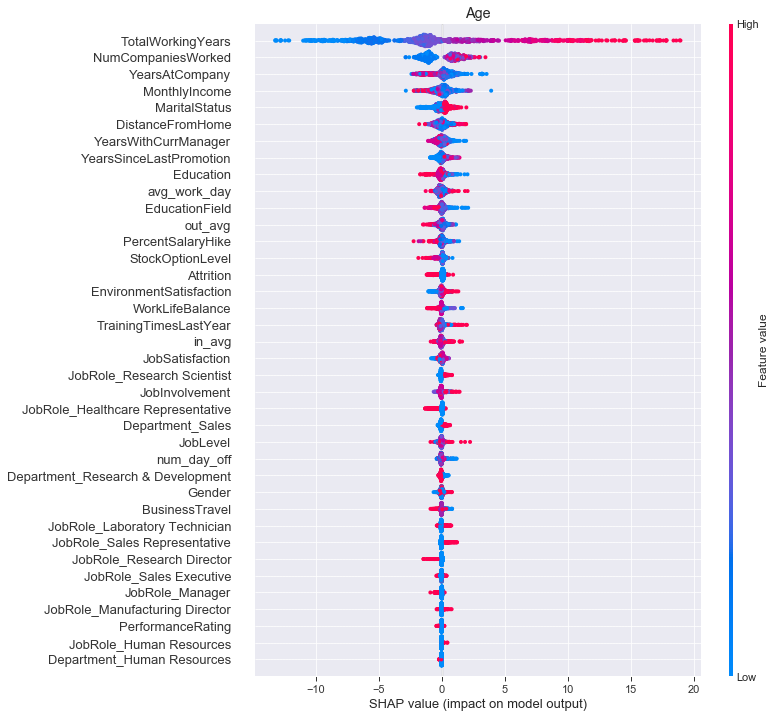

['Gender']


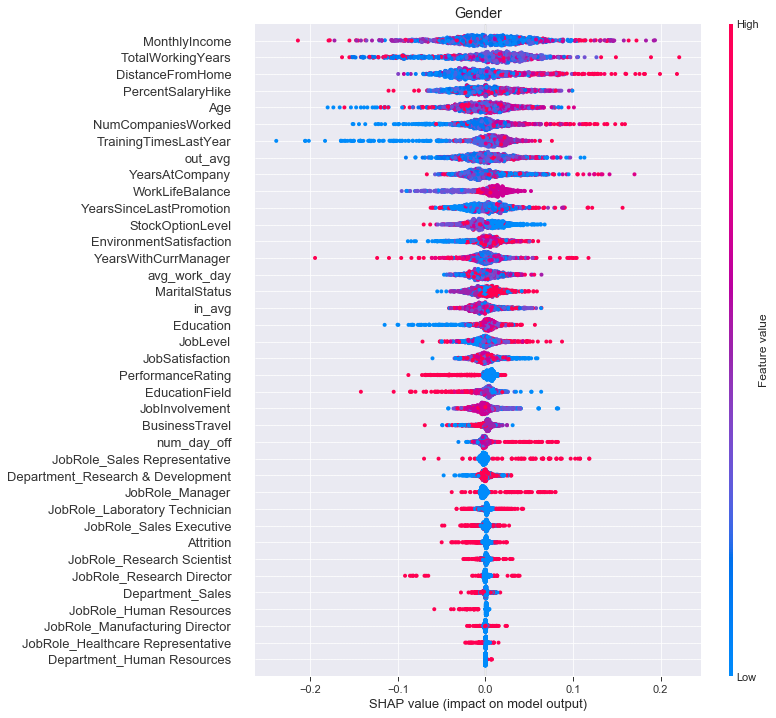

KeyError: "None of [Index(['EmployeeID'], dtype='object')] are in the [columns]"

In [321]:
import shap
from lightgbm import LGBMRegressor
from sklearn.model_selection import train_test_split


features = [
    # EDA for Managers
    'PerformanceRating', 'JobSatisfaction', 'JobInvolvement',
    'EnvironmentSatisfaction', 'Attrition', 'YearsAtCompany',
    'MonthlyIncome', 'StockOptionLevel', 'PercentSalaryHike', 'YearsWithCurrManager',
    'Education', 'WorkLifeBalance', 'MaritalStatus', 'JobLevel', 'DistanceFromHome',
    'TotalWorkingYears', 'TrainingTimesLastYear', 'BusinessTravel',
    'EducationField', 'NumCompaniesWorked', 'YearsSinceLastPromotion',
    'avg_work_day', 'num_day_off',
    'in_avg', 'out_avg', 'Age', 'Gender', 'EmployeeID'
    ]


for col in features[:]:
    df_research = df2.copy()

    target = [col]
    predictors = list(set(list(df_research.columns)) - set(target))

    X = df_research[predictors]
    y = df_research[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

    print(f'{target}')
    model = LGBMRegressor(random_state=0).fit(X_train, y_train)
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_test)
    

    plt.title(col)
    plt.gcf().subplots_adjust()
    shap.summary_plot(shap_values, X_test, max_display=X.shape[1], show=True, plot_size=(10, 12))
    plt.savefig("shap_"+col+"_.png")
    plt.close()

In [322]:
undesirable = df.loc[(df['JobInvolvement'] >= 3) & (df['PerformanceRating'] == 4)]
undesirable

,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating,Age,Attrition,BusinessTravel,Department,DistanceFromHome,...,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,in_avg,out_avg,avg_work_day,num_day_off
6,1.0,3.0,1.0,3,4,28,Yes,Travel_Rarely,Research & Development,11,...,1,5.0,2,0,0,0,9.954618,16.878066,6.923449,17
7,1.0,2.0,3.0,3,4,29,No,Travel_Rarely,Research & Development,18,...,3,10.0,2,0,0,0,9.994284,16.718320,6.724036,6
8,2.0,4.0,3.0,3,4,31,No,Travel_Rarely,Research & Development,1,...,0,10.0,2,9,7,8,10.013841,17.250725,7.236884,19
24,1.0,1.0,3.0,3,4,26,No,Travel_Frequently,Research & Development,9,...,0,5.0,3,5,3,3,9.995728,20.971008,10.975280,10
43,3.0,4.0,2.0,3,4,39,No,Travel_Rarely,Sales,5,...,0,19.0,3,18,3,7,9.976211,17.612536,7.636325,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4265,3.0,2.0,3.0,3,4,33,No,Travel_Rarely,Sales,9,...,2,7.0,2,3,1,1,10.011983,17.475069,7.463085,6
4273,3.0,4.0,2.0,3,4,29,Yes,Travel_Rarely,Research & Development,7,...,0,4.0,2,4,0,1,10.003291,18.409314,8.406022,10
4277,4.0,4.0,2.0,4,4,50,No,Travel_Rarely,Research & Development,11,...,1,32.0,2,7,0,6,10.010823,17.753968,7.743146,17
4279,4.0,4.0,3.0,3,4,43,No,Travel_Rarely,Sales,1,...,0,22.0,3,17,1,9,10.008969,19.275706,9.266737,12


PDP graphs(for checking partial dependences of features on attrition)

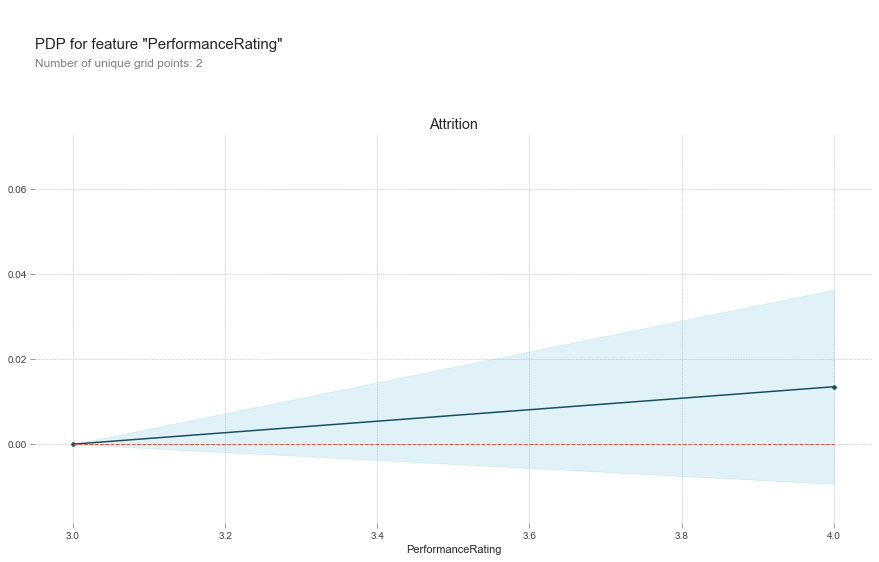

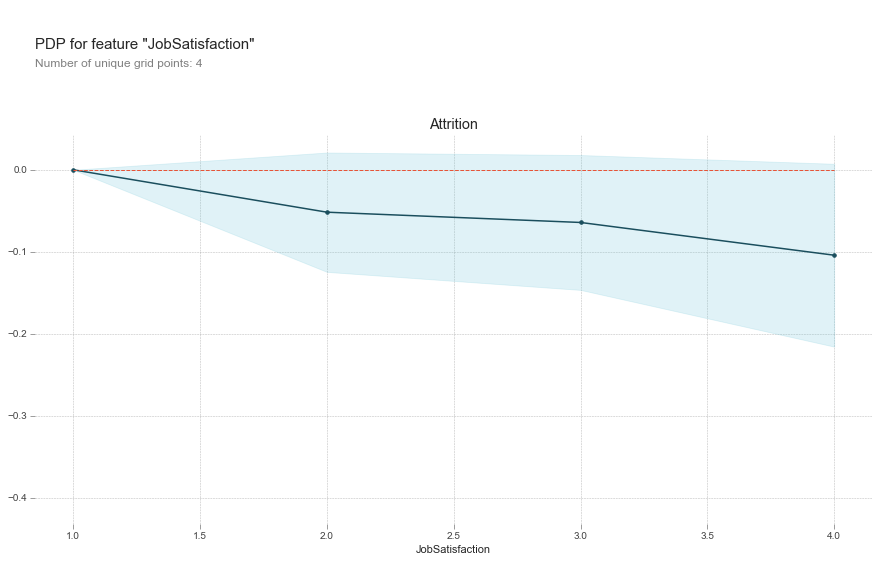

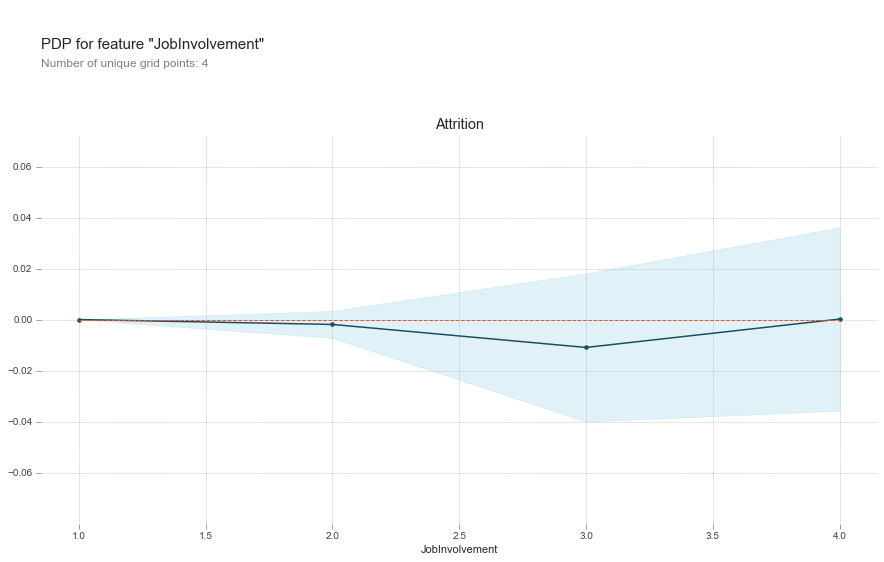

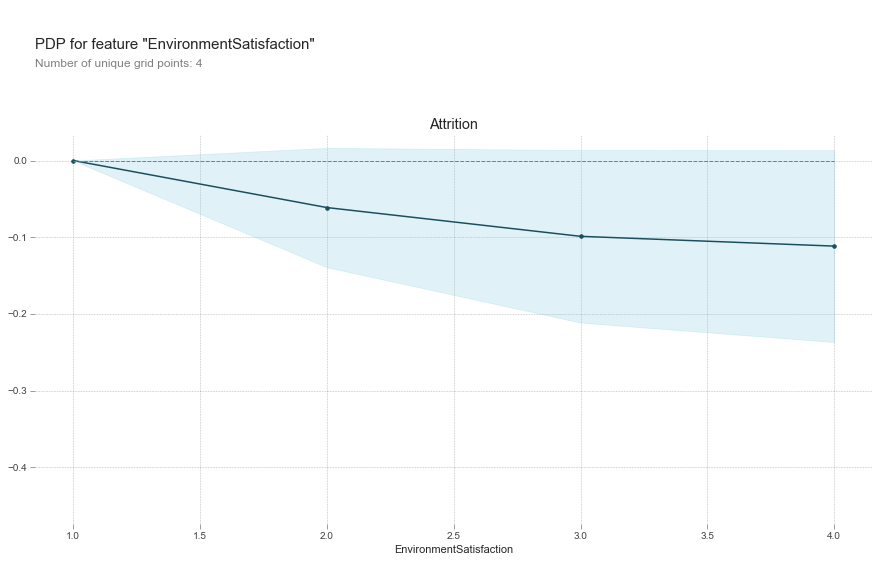

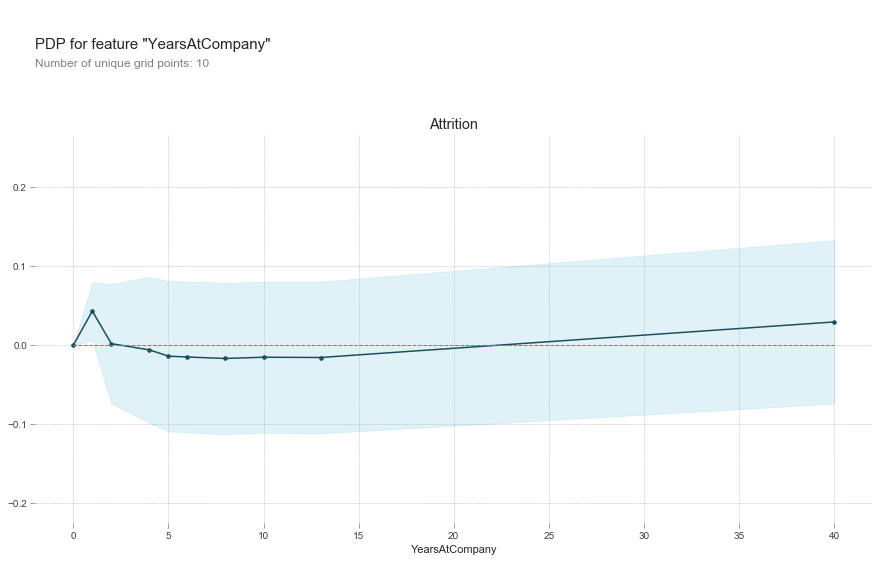

...

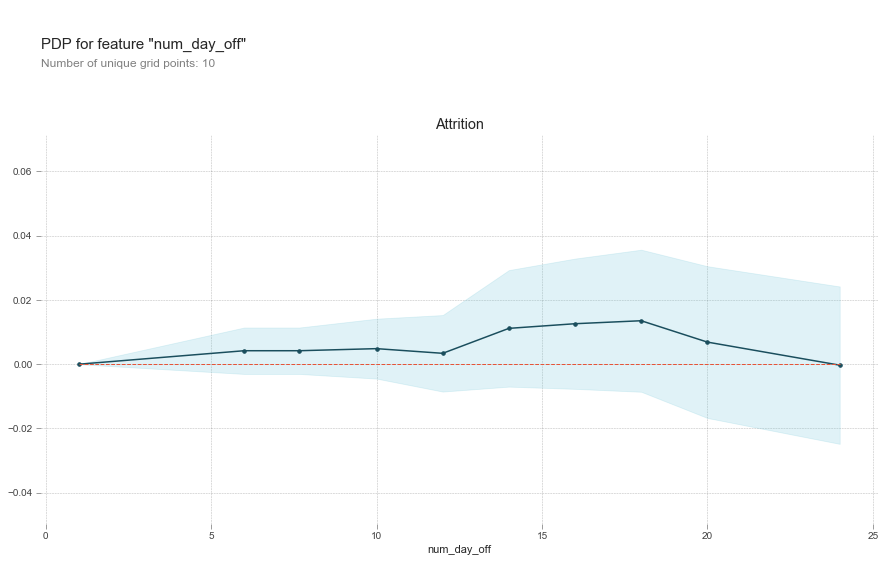

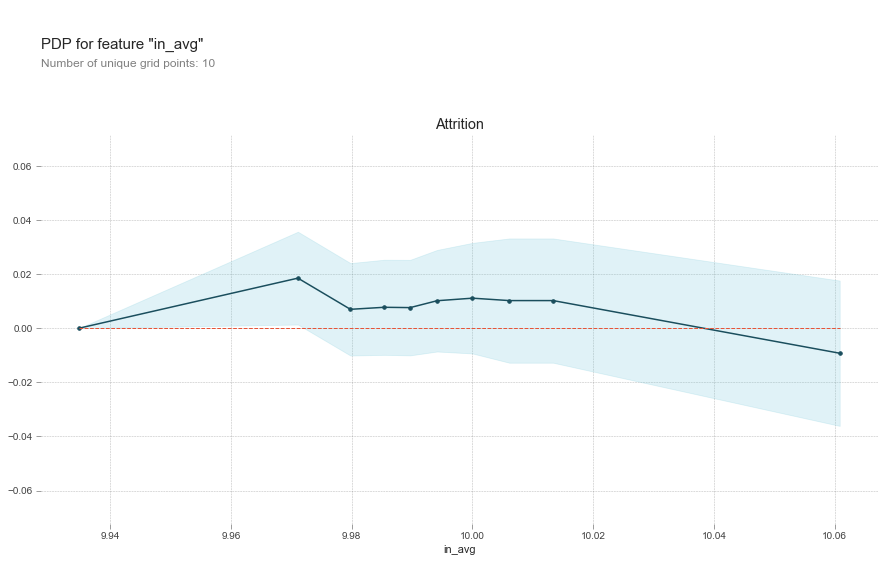

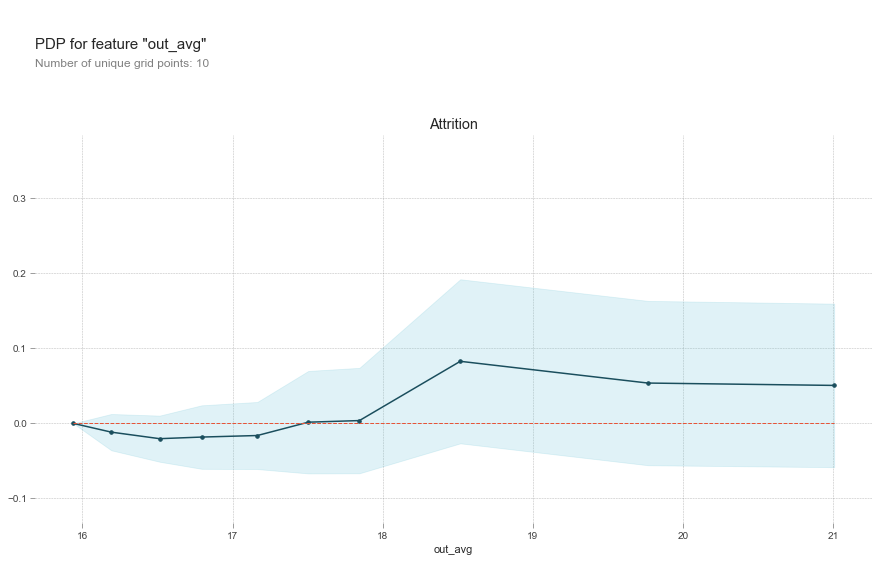

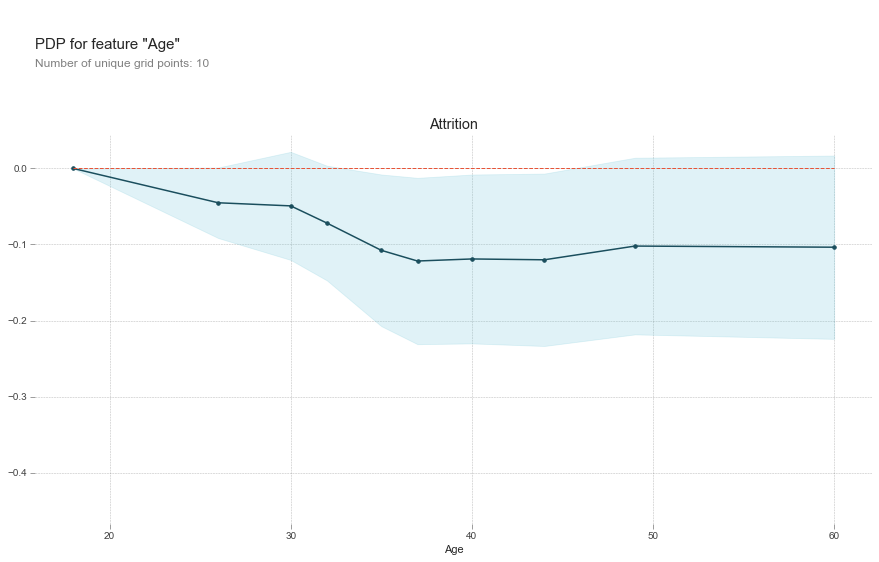

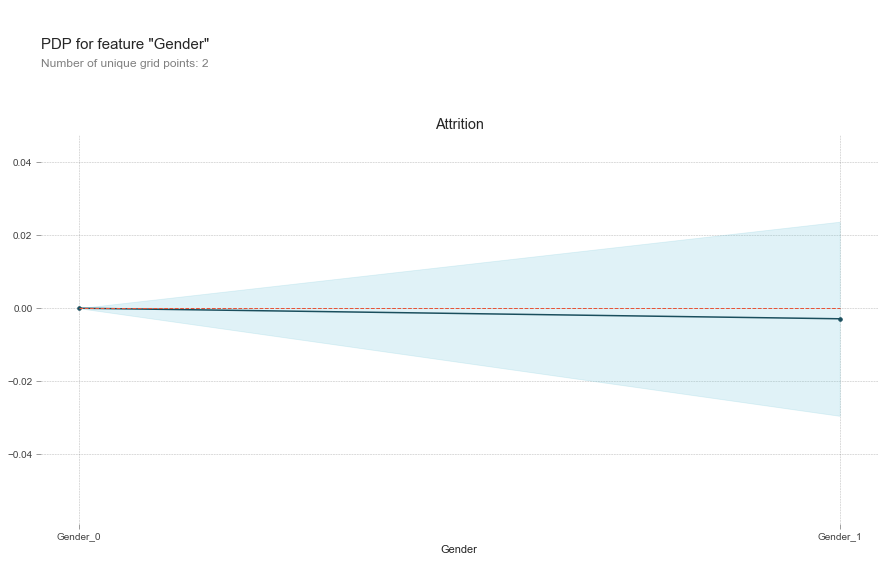

In [323]:
from matplotlib import pyplot as plt
from pdpbox import pdp
from lightgbm import LGBMRegressor


df_permutation_1 = df2.copy()

features = [
    'PerformanceRating', 'JobSatisfaction', 'JobInvolvement',
    'EnvironmentSatisfaction', 'YearsAtCompany',
    
    'MonthlyIncome', 'StockOptionLevel', 'PercentSalaryHike', 'YearsWithCurrManager',
    'Education', 'WorkLifeBalance', 'MaritalStatus', 'JobLevel', 'DistanceFromHome',
    'TotalWorkingYears', 'TrainingTimesLastYear', 'BusinessTravel',
    'EducationField', 'NumCompaniesWorked', 'YearsSinceLastPromotion',
    'avg_work_day', 'num_day_off',

    'in_avg', 'out_avg', 'Age', 'Gender'
    ]

target = ['Attrition']
predictors = list(set(list(df_permutation_1.columns)) - set(target))

X = df_permutation_1[predictors]
y = df_permutation_1[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)


model = LGBMRegressor(random_state=0).fit(X_train, y_train)

for feature in features:
    pdp_dist = pdp.pdp_isolate(model=model,
                               dataset=X_test,
                               model_features=X_test.columns, 
                               feature=feature)

    pdp.pdp_plot(pdp_dist, feature)
    plt.title('Attrition')  #
    plt.savefig("pdp_"+feature+"_.png", dpi=100)
    plt.show()
    plt.close()  